# Inspect light curves of flag-filtered DIAObjects

Text from the ticket:
> Following DM-20435, we have a working set of flags used to filter out bad DIASources. See if the problems we saw before with highly variable nonsense totFlux (and also psFlux, apFlux) in the PPDB still appears with the remaining flag-filtered DIAObjects. Think about what we need to do to fix any remaining weirdness. (Some metric we can compute from flux data in the PPDB/diasrc/src to determine if a DIAObject is "really variable" or not? Some flux cut or SNR cut? Some measure of how far the position of the DIASource is from the DIAObject?)

In this notebook:
* We use Ian's new high-res CompareWarp template ap_pipe rerun as the latest and greatest.
* We verify the `totFlux` light curves (which are forced photometry on the calexp at the DIA Source location) for the flag-filtered "good" sources still show lots more scatter (variability), much of which probably isn't real.
* We inspect histograms showing object counts as a function of number of sources as well as `gPSFluxMean`. Each histogram shows a comparison between all sources vs. "good" flag-filtered sources. We note that throwing out sources with the shape flag throws out all negative sources, whoops.
* We do a quick plot of all the "good" sources on the sky as well as a zoomed mini-region with various flagged sources plotted in red, and a corresponding flag tally bar chart. No surprises here (except for the recent point that the new high-res CompareWarp templates got rid of a lot of junk! hooray!).
* We plot light curves for 10 "good" objects and explore the idea of computing a metric that can differentiate real variability from bogus variability (spoiler: this is more complicated than originally hoped)
* We plot postage stamp cutouts of template images for the same 10 objects with object and source locations overlaid. These are instructive in seeing how the source location dances around, how the PSF size varies, and how many of the sources comprising a nominally "good" object are in fact not so good.
* We plot postage stamps of **all** the calexps and diffims for the same 10 objects.
* We very briefly explore trying the SimpleShape plugin during diffim measurement for a small data subset (instead of SdssShape) to see if it allows negative sources to be un-flagged (spoiler: yes!).

Some key takeaways:
* The high-res templates continue to be much better than the older lower-res templates.
* The general shape failure flag is set for all negative sources in the difference images, eeeek!
* Before we fixed the background subtraction problems, the "shape" flag (from the SdssShape algorithm) was a useful diagnostic, and we didn't even realize it was throwing out all the negative sources. Now we have removed nearly all of the background junk, and this problem is more obvious.
* There are large-scale lines (satellites?) that appear in the all-good-sources-on-the-sky plot now.
* As we (mostly) knew, the DIA Source location does move around a decent amount, but now we can visualize that with little thumbnails of each differencing template overlaid with Object and Source positions. Hooray!
* PSF sizes can vary for lots of reasons, and none of the analysis here takes into count S/N or seeing, but it is still somewhat illustrative to plot the Source positions with circles illustrating their PSF sizes (determinant radii).
* The criteria for calling a DIA Object "good" means it is composed of one or more "good" DIA Sources. This by definition means it can also be composed of a few "bad" DIA Sources.
* Plotting some light curves does suggest a correlation between erroneous flux trends and how far a source is from the object location; individual source diffim cutouts also continue to show some funky shapes that are hard to fit a PSF location to.
* There is no immediately obvious way to make a cut on which `totFlux` light curves points are likely to be discrepant.
* It is possible to use the SimpleShape plugin for difference imaging source measurement instead of SdssShape without a failure flag happening for all negative detections. More work needs to be done to determine what is causing SdssShape to throw a flag for negative detections in the first place and whether it we want to use a different shape algorithm or not.

In [543]:
%matplotlib notebook
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import itertools
import importlib
import functools
import operator

from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize
import astropy.units as u
import astropy.coordinates as coord

import lsst.geom
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')
from lsst.ap.association import UnpackPpdbFlags, MapDiaSourceConfig
from lsst.utils import getPackageDir
from lsst.daf.base import DateTime

In [544]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
from diaObjectAnalysis import loadAllPpdbObjects, loadAllPpdbSources, plotDiaObjectsOnSky #, setObjectFilter
import plotLightcurve as plc  # in_ipynb, loadPpdbObjects, loadPpdbSources, patchFinder, plotLightcurve

In [ ]:
# Only if you change anything in the code imported above
importlib.reload(plc)

Point to a recent ap_pipe run

In [545]:
#repo = '/project/mrawls/hits2015/rerun/cw_processed6'  # low-res templates
repo = '/project/sullivan/hits2015B/ap_pipe/cw_processed2'  # high-res templates
butler = dafPersist.Butler(repo)
dbName = 'association.db'
dbPath = os.path.join(repo, dbName)

In [546]:
objTable = loadAllPpdbObjects(repo, dbName)
srcTableAll = loadAllPpdbSources(repo, dbName)

In [570]:
badFlagList = ['base_PixelFlags_flag_bad', 'base_PixelFlags_flag_suspect', 'base_PixelFlags_flag_saturatedCenter']

In [571]:
def makeSrcTableFlags(srcTbl, objTbl, badFlagList=badFlagList):
    config = MapDiaSourceConfig()
    unpacker = UnpackPpdbFlags(config.flagMap, 'DiaSource')
    flagValues = unpacker.unpack(srcTbl['flags'], 'flags')
    flagTable = pd.DataFrame(flagValues, index=srcTbl.index)
    srcTableFlags = pd.merge(srcTbl, flagTable, left_index=True, right_index=True)
    badFlags = [srcTableFlags[flag] for flag in badFlagList]
    flagFilter = functools.reduce(operator.or_, badFlags)
    noFlagFilter = ~flagFilter
    goodSrc = srcTableFlags.loc[noFlagFilter]
    goodObjIds = set(srcTableFlags.loc[noFlagFilter, 'diaObjectId'])
    goodObj = objTbl.loc[objTbl['diaObjectId'].isin(goodObjIds)]
    return flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, goodSrc, goodObj

In [572]:
flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, \
    goodSrc, goodObj = makeSrcTableFlags(srcTableAll, objTable)

In [574]:
# Make a second set of filtered objects and sources including the shape flag as one of the bad ones
badFlagListShape = badFlagList.copy()
badFlagListShape.append('slot_Shape_flag')
flagTableShape, flagValuesShape, srcTableFlagsShape, flagFilterShape, noFlagFilterShape, \
    goodSrcShape, goodObjShape = makeSrcTableFlags(srcTableAll, objTable, badFlagList=badFlagListShape)

In [576]:
print(np.max(goodObj['gPSFluxMean']), np.std(goodObj['gPSFluxMean']))

10749726.052722674 101314.16863815894


### First up: all the totFluxes vs. time

<IPython.core.display.Javascript object>


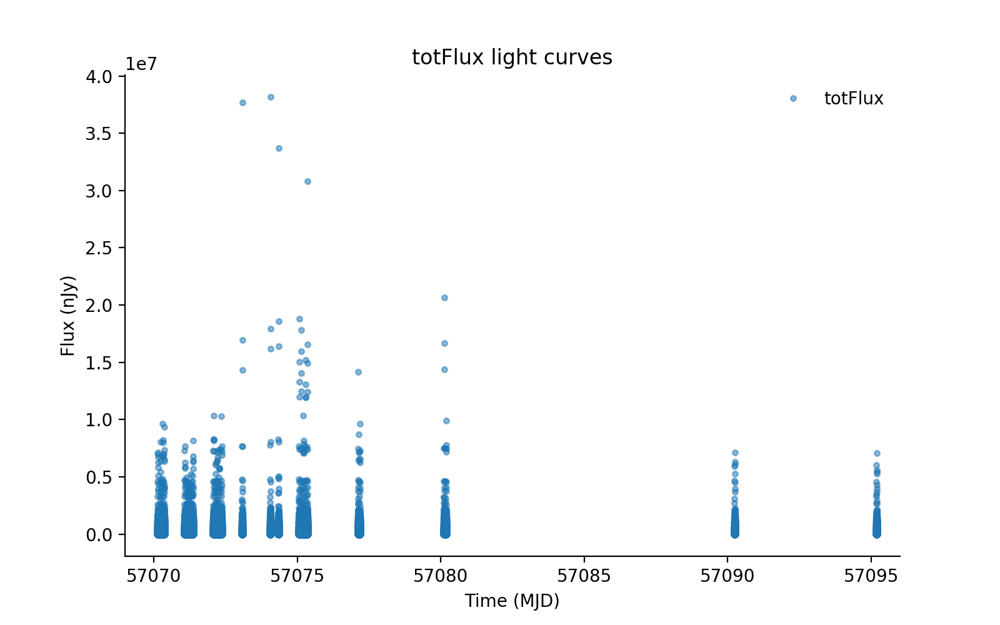

Text(0.5, 1.0, 'totFlux light curves')

In [552]:
plt.figure(figsize=(8,5))
#plt.plot(goodSrc['midPointTai'], goodSrc['psFlux'], alpha=0.5, marker='.', ls='None', label='psFlux')
#plt.plot(goodSrc['midPointTai'], goodSrc['apFlux'], alpha=0.5, marker='.', ls='None', label='apFlux')
plt.plot(goodSrc['midPointTai'], goodSrc['totFlux'], alpha=0.5, marker='.', ls='None', label='totFlux')
plt.xlabel('Time (MJD)')
plt.ylabel('Flux (nJy)')
plt.gca().set_xlim([57069, 57096])
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.legend(frameon=False)
plt.title('totFlux light curves')

### Next up: everyone's favorite histograms

<IPython.core.display.Javascript object>


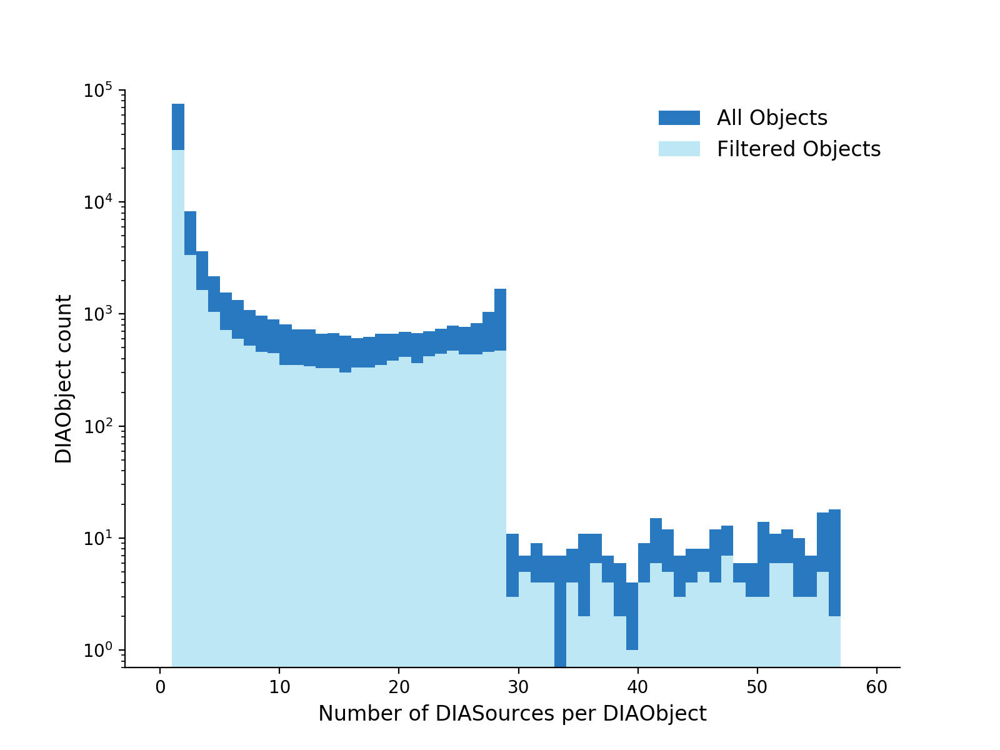

In [553]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.ylim(0.7, 1e5)
plt.yscale('log')
plt.hist(objTable['nDiaSources'].values, bins=np.arange(0, 60), color='#2979C1', label='All Objects')
plt.hist(goodObj['nDiaSources'].values, bins=np.arange(0, 60), color='#Bee7F5', label='Filtered Objects')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

In [554]:
def plotFluxHist(objTable1, objTable2=None, label1=None, label2=None, title=None):
    plt.figure(figsize=(9, 6))
    plt.xlabel('gPSFluxMean', size=12)
    plt.ylabel('DIAObject count', size=12)
    #bins = np.concatenate((-1*np.flip(np.logspace(-1, 6, 50)), np.logspace(-1, 6, 50)))
    bins = np.linspace(-1e4, 1e4, 200)
    #plt.yscale('log')
    #plt.xscale('symlog')

    plt.hist(objTable1['gPSFluxMean'].values, bins=bins, color='#2979C1', label=label1)

    if objTable2 is not None:
        plt.hist(objTable2['gPSFluxMean'].values, bins=bins, color='#Bee7F5', label=label2)

    plt.legend(frameon=False, fontsize=12)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


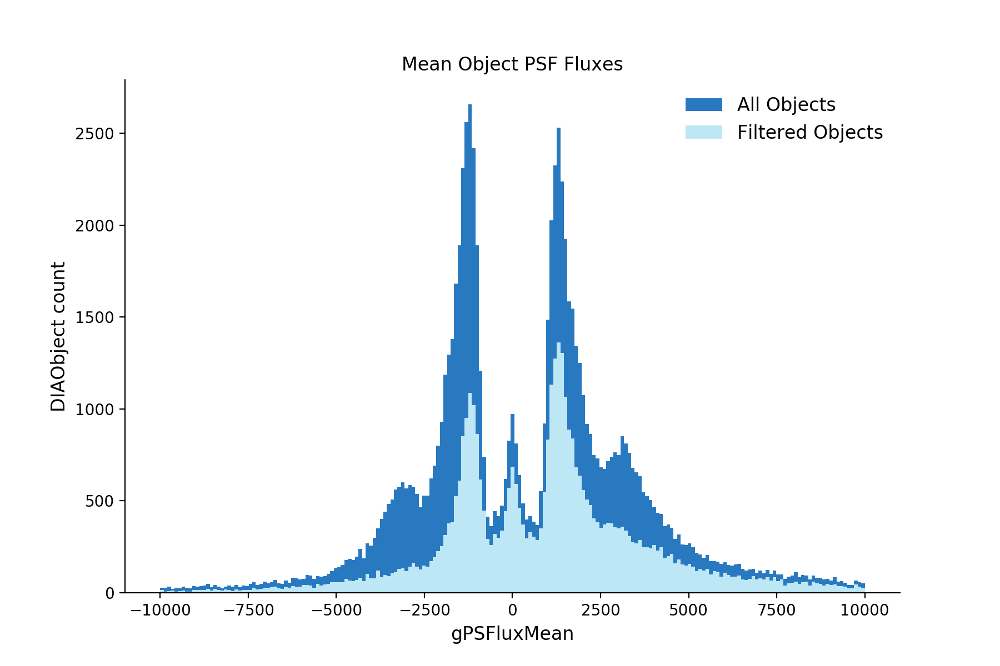

In [555]:
plotFluxHist(objTable, goodObj, label1='All Objects', label2='Filtered Objects', title='Mean Object PSF Fluxes')

In [556]:
def plotFluxHistSrc(srcTable1, srcTable2=None, label1=None, label2=None, title=None):
    plt.figure(figsize=(9, 6))
    plt.xlabel('gPSFlux', size=12)
    plt.ylabel('DIASource count', size=12)
    #bins = np.concatenate((-1*np.flip(np.logspace(-1, 6, 50)), np.logspace(-1, 6, 50)))
    bins = np.linspace(-1e4, 1e4, 200)
    #plt.yscale('log')
    #plt.xscale('symlog')
    plt.hist(srcTable1['psFlux'].values, bins=bins, color='#2979C1', label=label1)
    if srcTable2 is not None:
        plt.hist(srcTable2['psFlux'].values, bins=bins, color='#Bee7F5', label=label2)
    plt.legend(frameon=False, fontsize=12)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


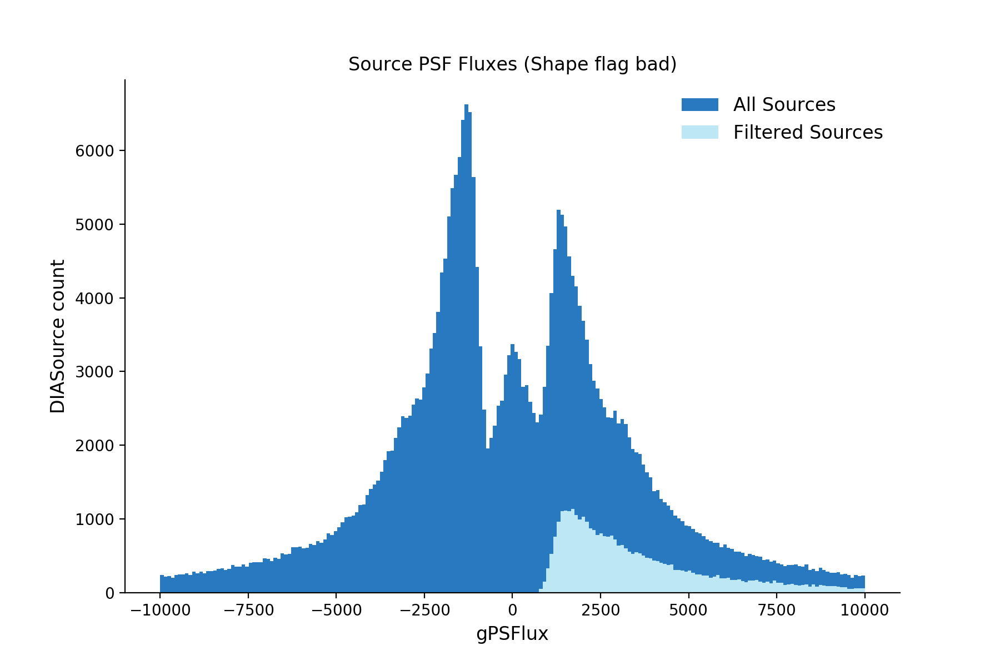

In [557]:
plotFluxHistSrc(srcTableAll, srcTable2=goodSrcShape, label1='All Sources', label2='Filtered Sources', title='Source PSF Fluxes (Shape flag bad)')

Gosh darn it we have managed to filter out any source with a negative PSF Flux... the culprit is the Shape flag!

<IPython.core.display.Javascript object>


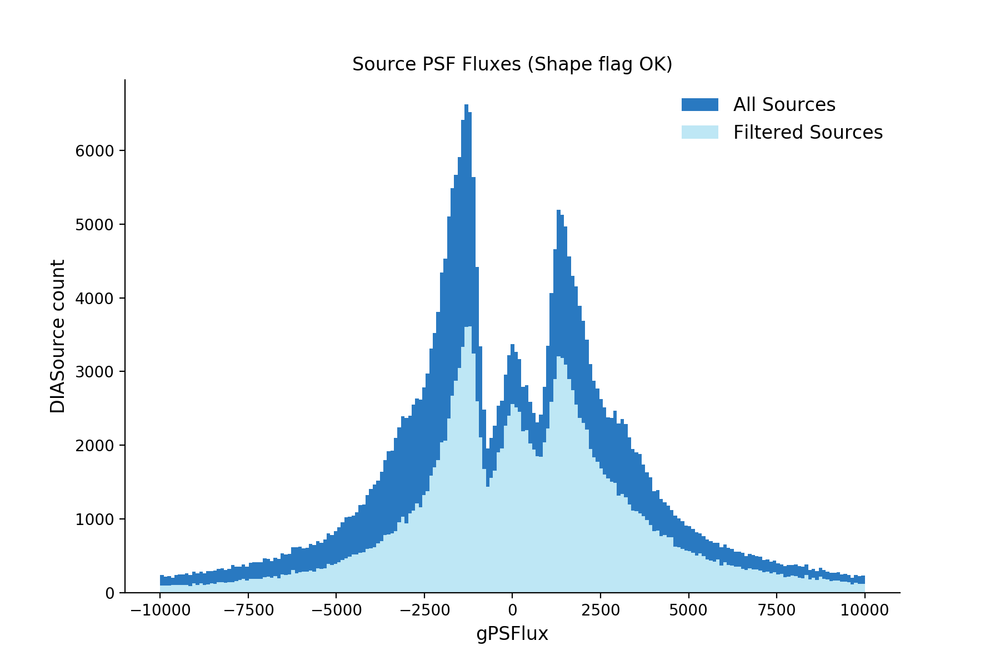

In [558]:
plotFluxHistSrc(srcTableAll, srcTable2=goodSrc, label1='All Sources', label2='Filtered Sources', title='Source PSF Fluxes (Shape flag OK)')

### That was fun, let's proceed *without* filtering out shape flagged sources

In [559]:
def plotHitsSourcesOnSky(srcTable):
    fig = plt.figure(figsize=(10, 8))
    ax1 = plt.subplot2grid((100, 100), (0, 55), rowspan=50, colspan=45)  # 1 single HiTS field, on the right
    ax2 = plt.subplot2grid((100, 100), (0, 0), rowspan=90, colspan=50)  # 2 overlapping HiTS fields, on the left

    ax1Filter = (srcTable['decl'] > -2)
    ax2Filter = (~ax1Filter)

    scatter1 = ax1.scatter(srcTable.loc[ax1Filter, 'ra'],
                           srcTable.loc[ax1Filter, 'decl'], 
                           c='C0', s=2, alpha=0.2)
    scatter2 = ax2.scatter(srcTable.loc[ax2Filter, 'ra'], 
                           srcTable.loc[ax2Filter, 'decl'], 
                           c='C0', s=2, alpha=0.2)

    ax1.set_xlabel('RA (deg)')
    ax2.set_xlabel('RA (deg)')
    ax1.set_ylabel('Dec (deg)')
    ax2.set_ylabel('Dec (deg)')

    ax1.spines['top'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax1.invert_xaxis()
    ax2.invert_xaxis()

    ax1.yaxis.tick_right()
    ax1.yaxis.set_label_position('right')

    plt.subplots_adjust(wspace=0.1, hspace=0)

In [560]:
def spatial_flag_plot(df, flagName1, flagName2=None, operator=None, plotFlagged=True, plotUnFlagged=True, title=None):
    if flagName2 and operator:
        if operator == 'or':
            flagFilter = ((df[flagName1]) | (df[flagName2]))
            labelTrue = flagName1 + ' \nor ' + flagName2
            labelFalse = 'Neither ' + flagName1 + ' \nnor ' + flagName2
        elif operator == 'and':
            flagFilter = ((df[flagName1]) & (df[flagName2]))
            labelTrue = 'Both ' + flagName1 + ' \nand ' + flagName2
            labelFalse = 'Not ' + flagName1 + ' \nand ' + flagName2
        else:
            raise ValueError('Operator must be \'and\' or \n \'or\'')
    elif flagName2 and not operator:
        raise ValueError('Operator must be set if a second flag is given')
    else:  # just considering one flag
        flagFilter = (df[flagName1])
        labelTrue = flagName1
        labelFalse = 'No ' + flagName1
    flagFilterInverse = ~flagFilter
    fig, ax = plt.subplots(figsize=(9,6))
    if plotFlagged:
        scatterFlagged = ax.scatter(df.loc[flagFilter, 'ra'], df.loc[flagFilter, 'decl'], 
                    color='C3', s=5, alpha=0.2, label=labelTrue)
    if plotUnFlagged:
        scatterUnflagged = ax.scatter(df.loc[flagFilterInverse, 'ra'], df.loc[flagFilterInverse, 'decl'], 
                    color='C0', s=5, alpha=0.2, label=labelFalse)
    print('Flagged sources: {0}'.format(len(df.loc[flagFilter, 'ra'])))
    print('Unflagged sources: {0}'.format(len(df.loc[flagFilterInverse, 'ra'])))
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.invert_xaxis()
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(bbox_to_anchor=(0.97, 0.9))
    ax.set_xlim([155.3, 154.8])
    ax.set_ylim([-6.02, -5.60])
    plt.title(title)

<IPython.core.display.Javascript object>


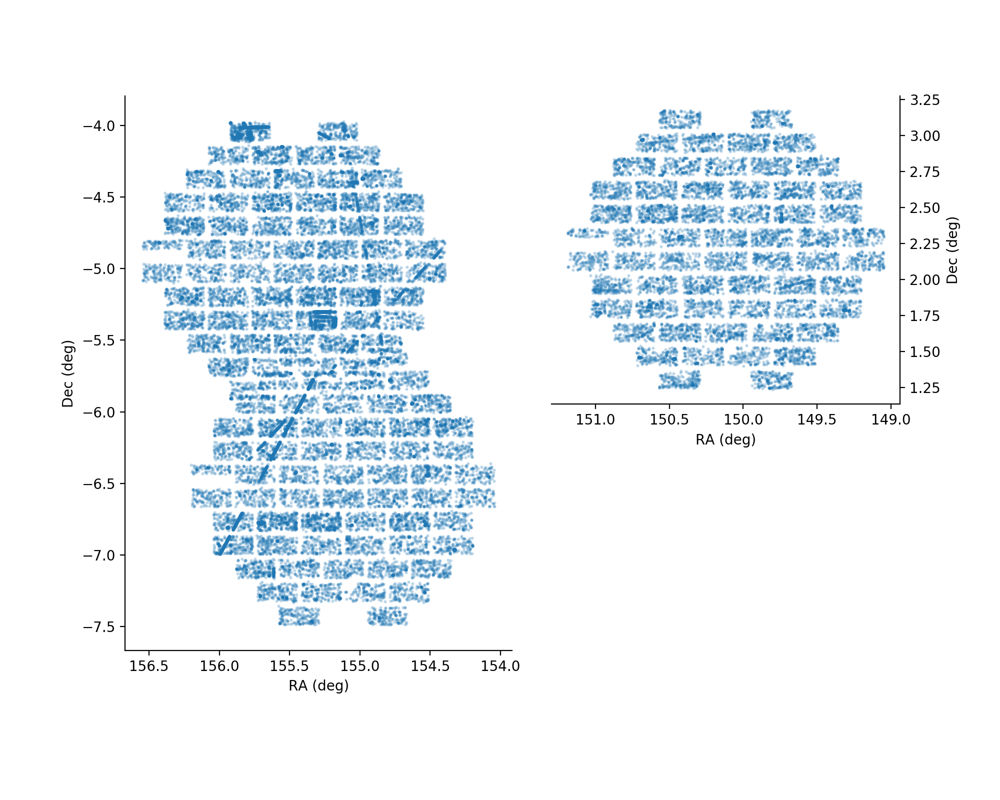

In [561]:
#objFilter = (goodObj['nDiaSources'] > 5)
#fig1 = plotDiaObjectsOnSky(repo, goodObj, objFilter, hits=True)
plotHitsSourcesOnSky(goodObj)

I HAVE NEVER SEEN THOSE BIG MULTI-CCD STREAKY THINGS BEFORE THAT IS SO COOL

### Spatial plots on a zoomed region with flagged sources color-coded red
And then histograms of flag distributions

<IPython.core.display.Javascript object>


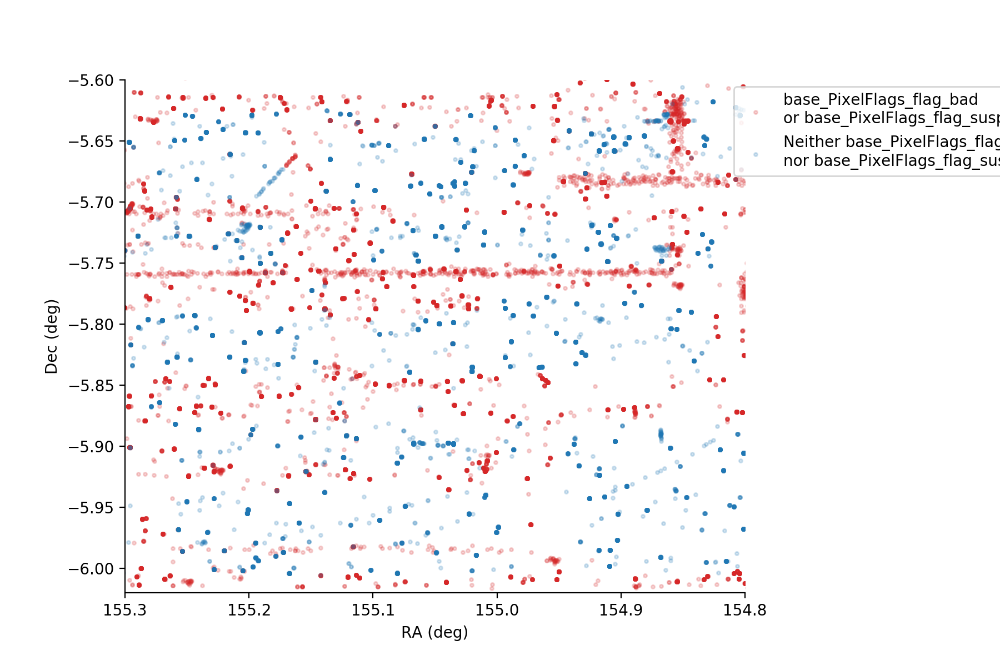

Flagged sources: 201107
Unflagged sources: 254931


In [562]:
spatial_flag_plot(srcTableFlags, 'base_PixelFlags_flag_bad', 'base_PixelFlags_flag_suspect', operator='or')

In [563]:
flagListNonzero = [
'base_PixelFlags_flag_edge',
'base_PixelFlags_flag_interpolated',
'base_PixelFlags_flag_saturated',
'base_PixelFlags_flag_cr',
'base_PixelFlags_flag_bad',
'base_PixelFlags_flag_suspect',
'base_PixelFlags_flag_interpolatedCenter',
'base_PixelFlags_flag_saturatedCenter',
'base_PixelFlags_flag_crCenter',
'base_PixelFlags_flag_suspectCenter',
'slot_PsfFlux_flag',
'slot_Shape_flag',
'slot_Shape_flag_unweightedBad',
'slot_Shape_flag_unweighted',
'slot_Shape_flag_shift',
'slot_Shape_flag_maxIter']

In [564]:
def makeFlagGridPlot(flagList, srcTableFlags, title=None):
    fig = plt.figure(figsize=(10,10))
    if title:
        fig.suptitle(title)
    for idx, flagName in enumerate(flagListNonzero):
        plotFlagged = True
        plotUnFlagged = True
        ax = fig.add_subplot(4, 4, idx+1)
        flagFilter = (srcTableFlags[flagName])
        labelTrue = flagName
        labelFalse = 'No ' + flagName
        flagFilterInverse = ~flagFilter
        if plotFlagged:
            scatterFlagged = ax.scatter(srcTableFlags.loc[flagFilter, 'ra'], 
                                        srcTableFlags.loc[flagFilter, 'decl'], 
                                        color='C3', s=1, alpha=0.2, label=labelTrue)
        if plotUnFlagged:
            scatterUnflagged = ax.scatter(srcTableFlags.loc[flagFilterInverse, 'ra'], 
                                          srcTableFlags.loc[flagFilterInverse, 'decl'], 
                                          color='C0', s=1, alpha=0.2, label=labelFalse)
        #ax.set_xlabel('RA (deg)')
        #ax.set_ylabel('Dec (deg)')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        ax.invert_xaxis()
        plt.subplots_adjust(wspace=0.15, hspace=0.15)
        title = plt.title(flagName, size=7)
        title.set_position([0.5, 0.99])
        ax.set_xlim([155.3, 154.8])
        ax.set_ylim([-6.02, -5.60])

<IPython.core.display.Javascript object>


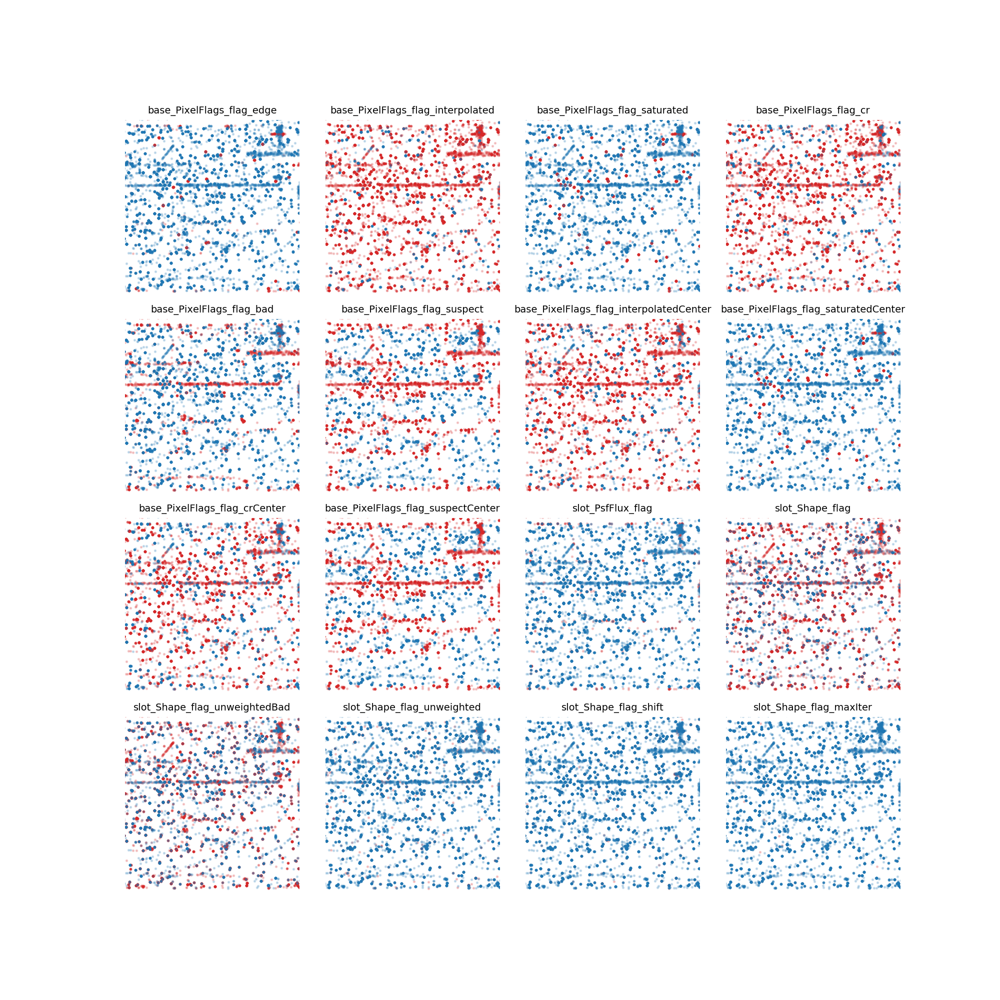

In [565]:
makeFlagGridPlot(flagListNonzero, srcTableFlags)

In [566]:
def plot_flag_hist(flags, labels, title=None):
    assert len(flags) == len(labels)
    assert len(flags) == 29  # because we're doing custom slicing below

    fig, ax = plt.subplots(figsize=(9,9))

    pixelflags = ax.barh(labels[0:8], flags[0:8], color='C0')
    pixelcenterflags = ax.barh(labels[8:12], flags[8:12], color='C1')
    centroidflags = ax.barh(labels[12:15], flags[12:15], color='C4')
    apfluxflags = ax.barh(labels[15:17], flags[15:17], color='C5')
    psffluxflags = ax.barh(labels[17:20], flags[17:20], color='C2')
    ip_diffimflags = ax.barh(labels[20:23], flags[20:23], color='C5')
    shapeflags = ax.barh(labels[23::], flags[23::], color='C3')

    #ax.xaxis.set_tick_params(rotation=89)
    fig.subplots_adjust(left=0.35)
    ax.set_xlabel('Number of flagged DIASources')

    ax.legend((pixelflags[0],
               pixelcenterflags[0],
               centroidflags[0],
               apfluxflags[0], 
               psffluxflags[0],
               ip_diffimflags[0],
               shapeflags[0]), 
              ('Pixel flags', 
               'Pixel center flags',
               'Centroid flags',
               'ApFlux flags',
               'PsfFlux flags',
               'ip_diffim flags',
               'Shape flags'),
              frameon=False, loc='upper right', ncol=2
             )

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


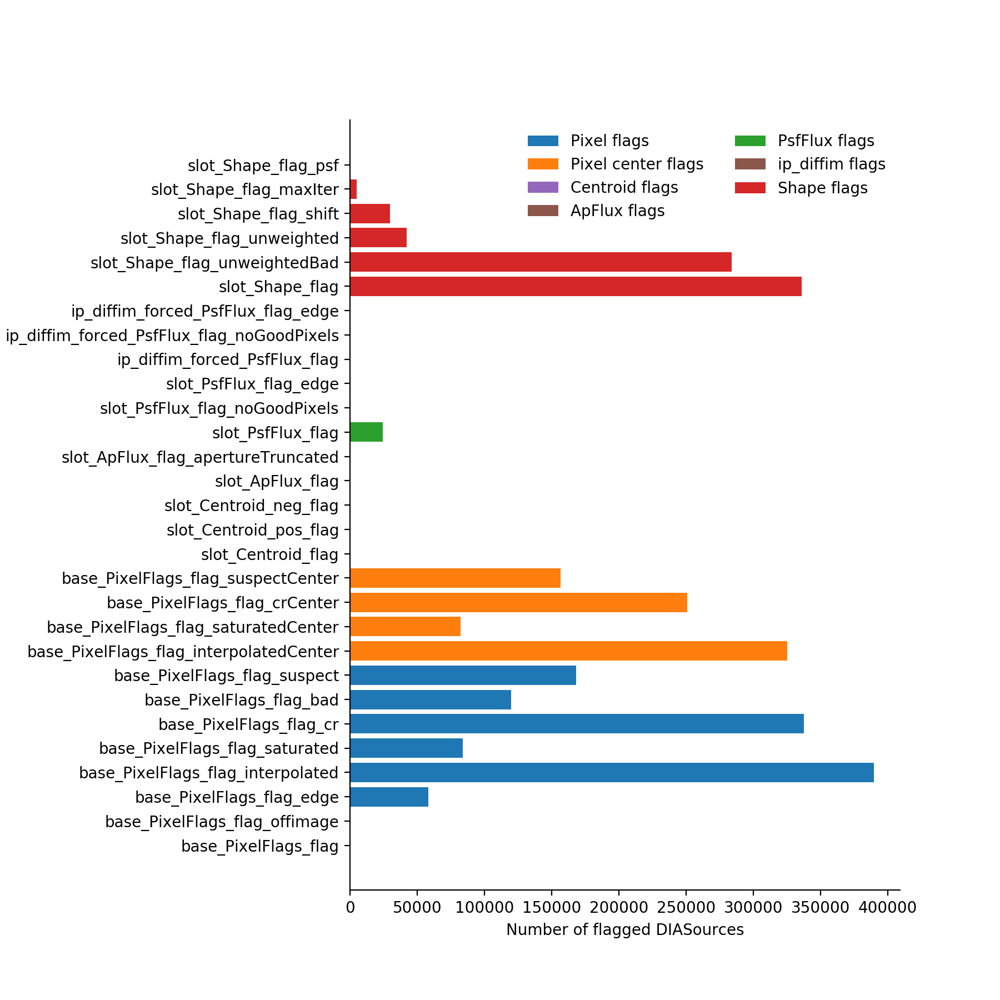

In [567]:
plot_flag_hist([count for count in flagTable.sum().values], list(flagValues.dtype.names))

In [568]:
def plotMiniRegionObjAndSrc(srcTableFlags, objTable, flagFilter, title=None):
    fig, ax2 = plt.subplots(figsize=(10,6))

    noFlagFilter = (~flagFilter)

    scatterUnflagged2 = ax2.scatter(srcTableFlags.loc[noFlagFilter, 'ra'], 
                                    srcTableFlags.loc[noFlagFilter, 'decl'], 
                                    c='C1', s=5, alpha=0.5, label='Good Source')
    scatterGoodObj2 = ax2.scatter(objTable.loc[(objTable['nDiaSources'] >= 20), 'ra'], 
                                  objTable.loc[(objTable['nDiaSources'] >= 20),'decl'], 
                                  c='C0', s=20, alpha=0.3, label='Good Object \nwith >=20 Sources')

    ax2.set_xlabel('RA (deg)')
    ax2.set_ylabel('Dec (deg)')

    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.invert_xaxis()

    box = ax2.get_position()
    ax2.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax2.legend(bbox_to_anchor=(1.03, 0.9), frameon=False, markerscale=2)
    
    ax2.set_xlim([155.3, 154.8])
    ax2.set_ylim([-6.02, -5.60])
    plt.title(title)

<IPython.core.display.Javascript object>


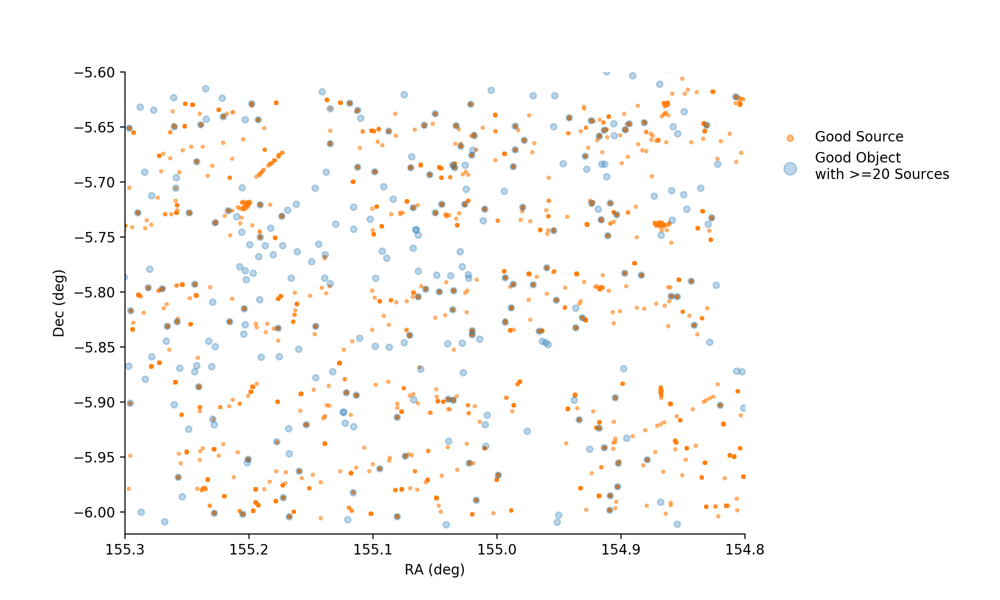

In [569]:
plotMiniRegionObjAndSrc(srcTableFlags, objTable, flagFilter)

## And now for some fun with fluxes and light curves
We'll plot several things at once as a function of time...
* `totFlux`, i.e., the thing that is in the PPDB Source table and is the forced photometry on the calexp at the DIA Source location. Bonus: we will color-code each flux point by whether the source has one or more bad flags.
* `srcFlux`, i.e., the flux directly from the calexp source catalog that's totally independent of difference imaging.
* `coord position separation`, i.e., how far away the source (RA, Dec) is from the object position on the sky (scaled so it looks decent on the plot)
* `coord position angle`, i.e., the angular direction in which the source (RA, Dec) is offset from the object (scaled so it looks decent on the plot)

It's important to keep in mind that, as things are currently defined, a DIA Object is in the "goodObj" table if it has one or more constituant "good" DIA Sources. It is common for DIA Objects that are "good" to be composed of mostly "bad" DIA Sources.

In [600]:
def plotFluxCompare(butler, db, obj, objTbl, fluxStrs = ['totFlux', 'psFlux', 'apFlux']):
    srcTbl = plc.loadPpdbSources(db, obj)
    _1, _2, srcTblFlags, _3, _4, goodSrcTbl, goodObjTbl = makeSrcTableFlags(srcTbl, objTbl)
    srcTblFlags['ccd'] = srcTblFlags['ccdVisitId'] % 100  # add a new column to the dataframe
    
    fig = plt.figure(figsize=(9,4))
    
    # Main plot of actual light curves
    fig.add_subplot(211)

    raObj = objTbl.loc[objTbl['diaObjectId'] == obj, 'ra']
    decObj = objTbl.loc[objTbl['diaObjectId'] == obj, 'decl']
    skyCoordObj = coord.SkyCoord(raObj, decObj, unit=u.degree)

    for fluxStr in fluxStrs:
        fluxToPlot = srcTblFlags[fluxStr]
        fluxErrToPlot = srcTblFlags[fluxStr+'Err']
        for idx, srcId in enumerate(srcTblFlags['diaSourceId'].values):
            if srcId in goodSrcTbl['diaSourceId'].values:  # plot in blue
                try: labelGood
                except NameError: labelGood=fluxStr+'Good'
                else: labelGood=None
                plt.errorbar(srcTblFlags['midPointTai'].iloc[idx], fluxToPlot.iloc[idx], yerr=fluxErrToPlot.iloc[idx], 
                             marker='o', ls=None, alpha=0.5, c='C4', label=labelGood)
            else:  # plot in red
                try: labelBad
                except NameError: labelBad=fluxStr+'Bad'
                else: labelBad=None
                plt.errorbar(srcTblFlags['midPointTai'].iloc[idx], fluxToPlot.iloc[idx], yerr=fluxErrToPlot.iloc[idx], 
                             marker='o', ls=None, alpha=0.5, c='C3', label=labelBad)

    timeList = []
    calibMeanList = []
    calibErrList = []
    psfAreaList = []
    sepList = []
    angList = []
    srccatCalibFluxes = []
    srccatCalibFluxErrs = []
    for visit in srcTblFlags['ccdVisitId']:
        visit = str(visit)
        dataId = {'visit': int(visit[0:6]), 'ccdnum': int(visit[6:])}
        #print(dataId)
        visit_info = butler.get('calexp_visitInfo', dataId=dataId)
        time = visit_info.getDate().get(system=DateTime.MJD)
        photoCalib = butler.get('calexp_photoCalib', dataId=dataId)
        timeList.append(time)
        calsrc = butler.get('src', dataId=dataId)
        calsrcAstropy = calsrc.asAstropy()
        calsrcSkyCoord = coord.SkyCoord(calsrcAstropy['coord_ra'], calsrcAstropy['coord_dec'], unit=u.rad)
        matchIdx, matchAngle, match3d = skyCoordObj.match_to_catalog_sky(calsrcSkyCoord)
        sep = calsrcSkyCoord[matchIdx].separation(skyCoordObj).arcsecond
        angle = calsrcSkyCoord[matchIdx].position_angle(skyCoordObj).degree
        sepList.append(sep[0])
        angList.append(angle[0])
        calibFlux = photoCalib.instFluxToNanojansky(calsrc, 'base_PsfFlux')[matchIdx]
        srccatCalibFluxes.append(calibFlux[0,0])
        srccatCalibFluxErrs.append(calibFlux[0,1])
    print('src flux mean, std: ', np.mean(srccatCalibFluxes), np.std(srccatCalibFluxes))
    print('coord separation mean, std: ', np.mean(sepList), np.std(sepList))
    print('coord angle mean, std: ', np.mean(angList), np.std(angList))
    plt.errorbar(timeList, srccatCalibFluxes, yerr=srccatCalibFluxErrs, 
                 marker='o', ls=':', alpha=0.5, label='srcFlux')
    
    plt.legend()
    plt.ylabel('Flux (nJy)')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_visible(False)
    plt.gca().axes.get_xaxis().set_visible(False)
    
    # Plot of sky separation and angle offsets
    fig.add_subplot(212)
    
    plt.plot(timeList, np.array(sepList)*1000, marker='s', ls=':', alpha=0.5, c='C1', label='coord separation (\" x 1000)')
    plt.plot(timeList, np.array(angList), marker='s', ls=':', alpha=0.5, c='C2', label='coord position angle (deg)')
    plt.legend()
    plt.xlabel('Time (MJD)')
    plt.ylabel('Offset')
    plt.gca().set_ylim([0, 360])
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

<IPython.core.display.Javascript object>


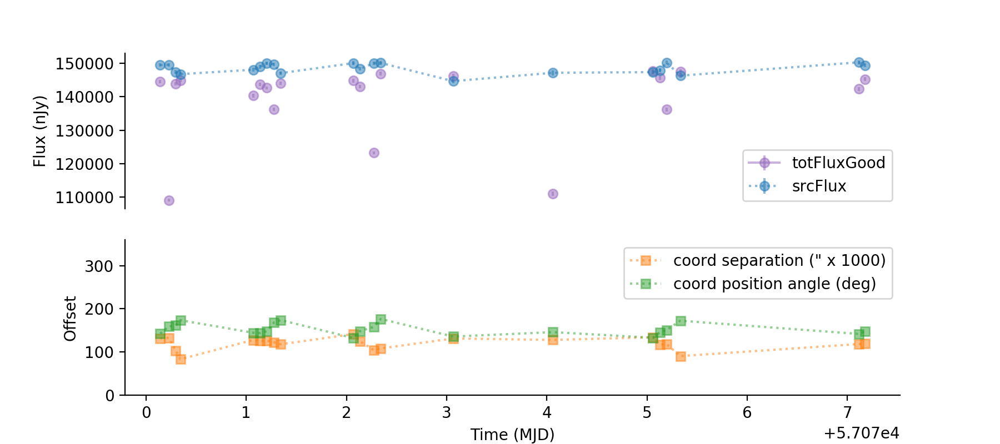

src flux mean, std:  148519.1874294015 1541.4527559993219
coord separation mean, std:  0.11937259674258045 0.014127485541992703
coord angle mean, std:  152.5546974295957 13.564264917419441


<IPython.core.display.Javascript object>


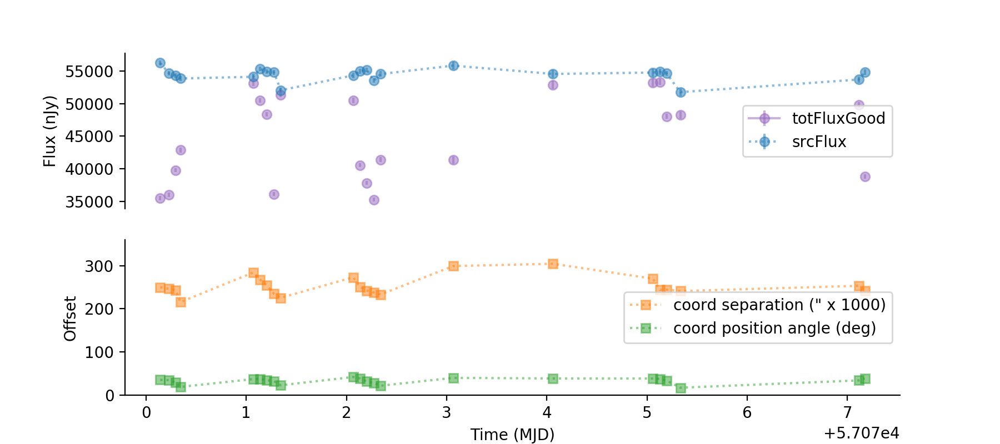

src flux mean, std:  54424.23974872636 1008.7103977828668
coord separation mean, std:  0.2526094219784803 0.021745893074106407
coord angle mean, std:  32.95792325282128 6.891118553647259


<IPython.core.display.Javascript object>


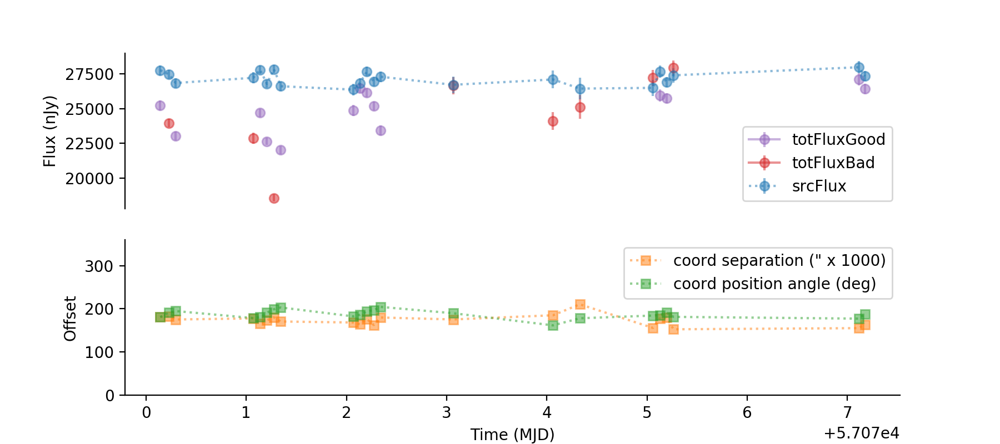

src flux mean, std:  27166.231934401523 486.48194586852014
coord separation mean, std:  0.17340719160574475 0.012231922686188874
coord angle mean, std:  187.29951769185334 9.528230764871763


<IPython.core.display.Javascript object>


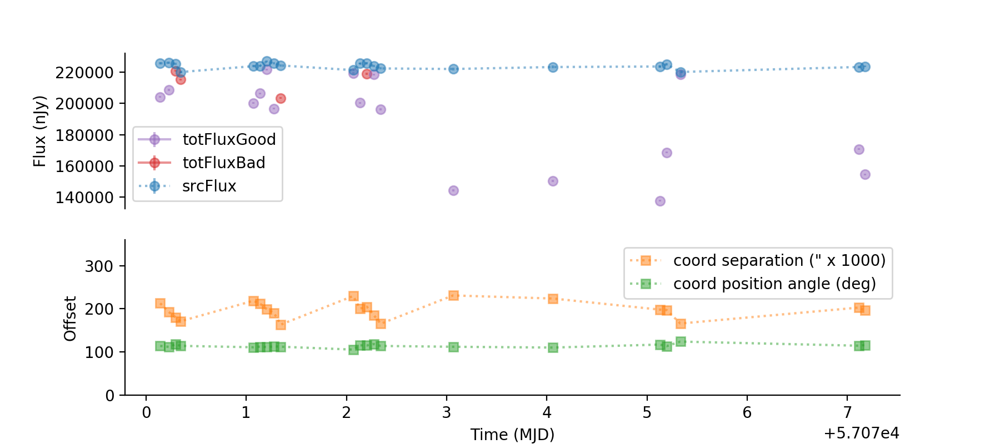

src flux mean, std:  223882.63373940854 1842.191976839646
coord separation mean, std:  0.197231043763639 0.019786208992294562
coord angle mean, std:  114.03385746059887 3.598812252010905


<IPython.core.display.Javascript object>


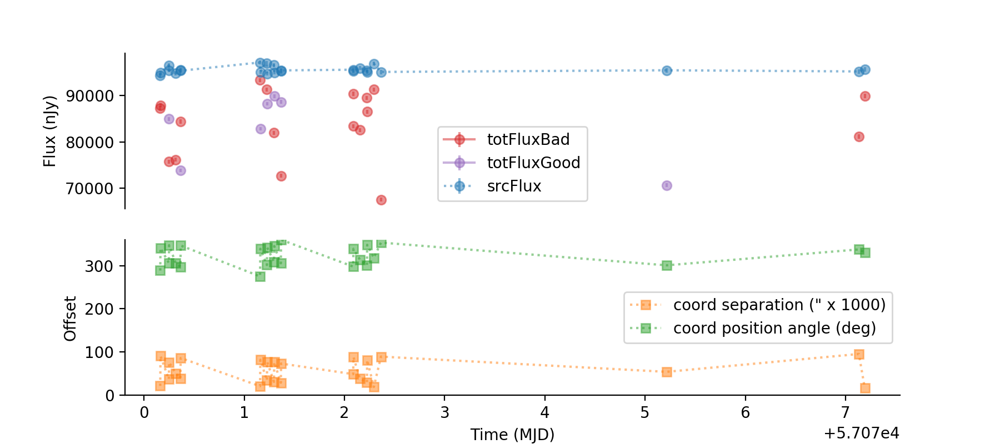

src flux mean, std:  95562.82462778146 723.2248605496189
coord separation mean, std:  0.05535479435703888 0.026644366766636226
coord angle mean, std:  322.04120467916056 23.15587563312064


<IPython.core.display.Javascript object>


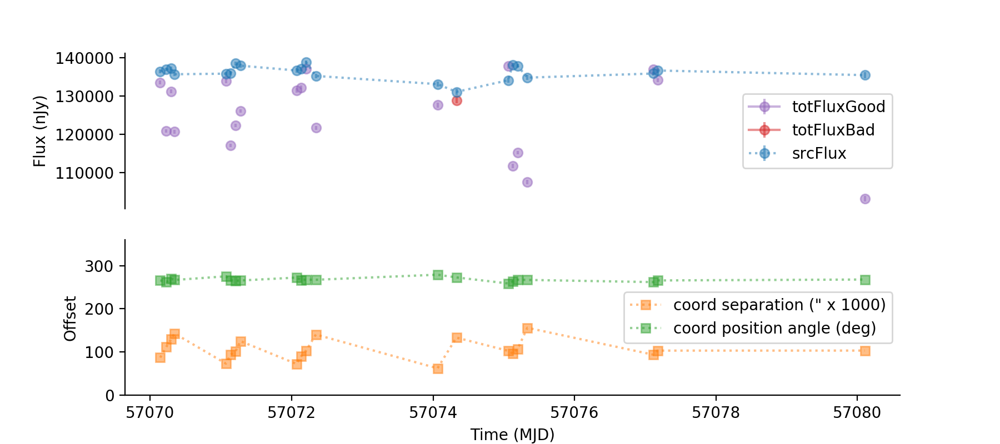

src flux mean, std:  136101.9678630858 1808.5615124435585
coord separation mean, std:  0.10616518697377682 0.023860557769083877
coord angle mean, std:  267.3761640606834 4.480706339841587


<IPython.core.display.Javascript object>


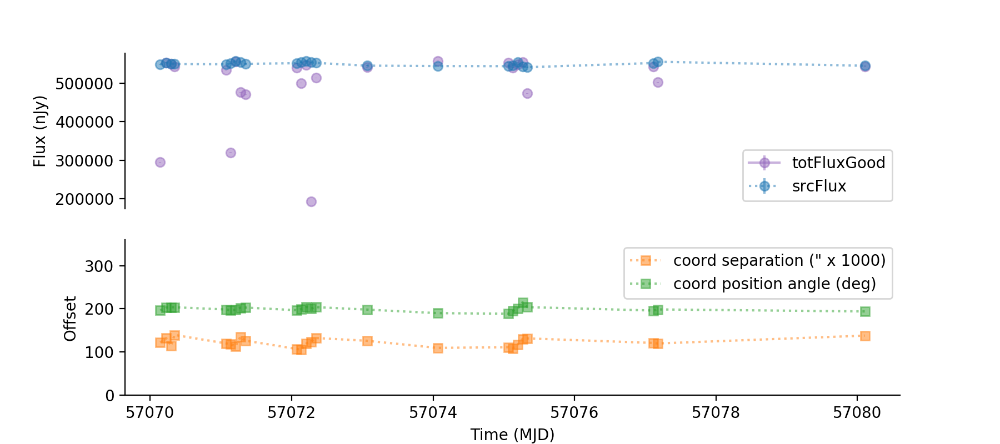

src flux mean, std:  549699.997470952 4513.023183283963
coord separation mean, std:  0.12173322713743072 0.009796350493397443
coord angle mean, std:  199.58830041682668 5.334719847042321


<IPython.core.display.Javascript object>


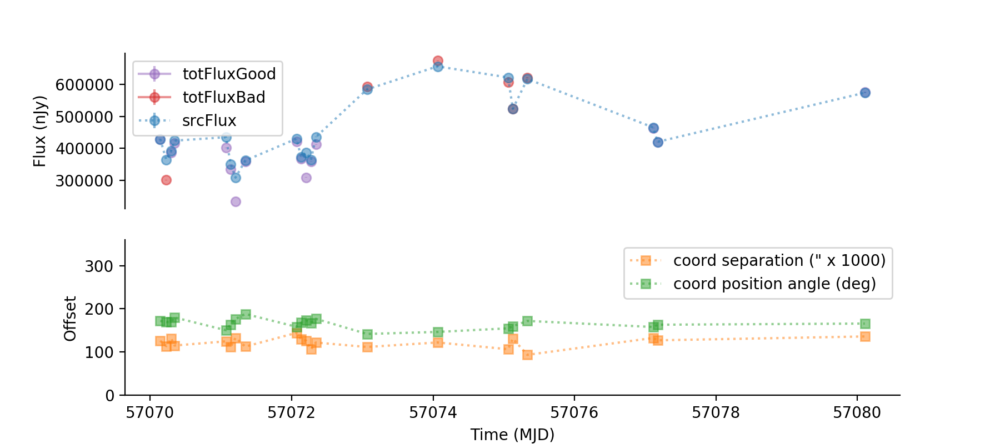

src flux mean, std:  453206.6743337239 99754.45017527937
coord separation mean, std:  0.12174151476858976 0.011852681888080115
coord angle mean, std:  165.5200402639046 11.085058048792774


<IPython.core.display.Javascript object>


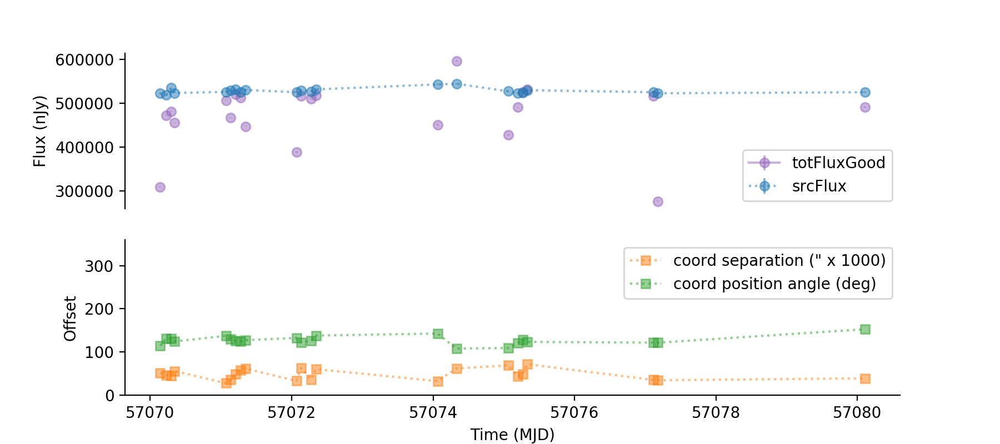

src flux mean, std:  528168.90831244 6134.157001466044
coord separation mean, std:  0.048200487246485485 0.012667469760670305
coord angle mean, std:  127.05632956965165 10.002562972050915


<IPython.core.display.Javascript object>


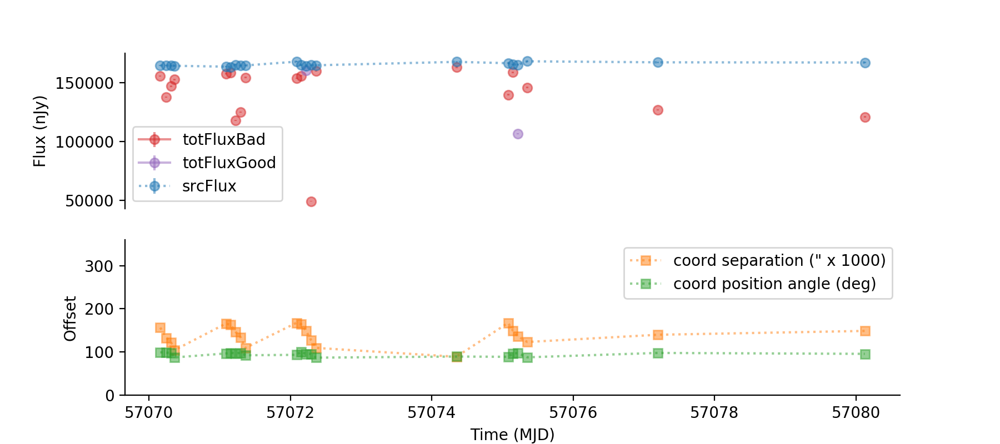

src flux mean, std:  165425.54639801025 1401.3659956051772
coord separation mean, std:  0.13842148296120027 0.022263299299166567
coord angle mean, std:  94.78644084102974 4.1948934660488275


In [601]:
for objId in goodObj.loc[goodObj['nDiaSources'] > 20, 'diaObjectId'].iloc[0:10]:
    plotFluxCompare(butler, dbPath, objId, goodObj.loc[goodObj['nDiaSources'] > 20], fluxStrs = ['totFlux'])

### Some takeaways from the light curve plots above

It would be nice if there were a clear coordinate offest variance threshold over which it strongly suggests the light curve will be a mess, but it's not that simple.

* "Good" and "Bad" totFluxes (purple and red, respectively) do **not** directly correlate with flux values that do/do not agree with the srcFlux (blue). That would have been too easy.
* By definition, the object location which we are using as "truth" is the mean of all the source locations, so that makes the **actual value** of the coord offset not particularly useful; instead how much it changes from source to source is what we care about, and we might care about its vector and not just its magnitude.
* There is no obvious coord sep standard deviation above which things are fine and below which things are garbage.
* We should remember that PSF size matters, so it's possible that a metric which somehow combines the PSF size and the position and/or angle separation could capture whether a flux is good or bad? **Future work**

## Let's make sure calexps and diffims overall haven't suddenly become horrible looking

41091501
5038


<IPython.core.display.Javascript object>


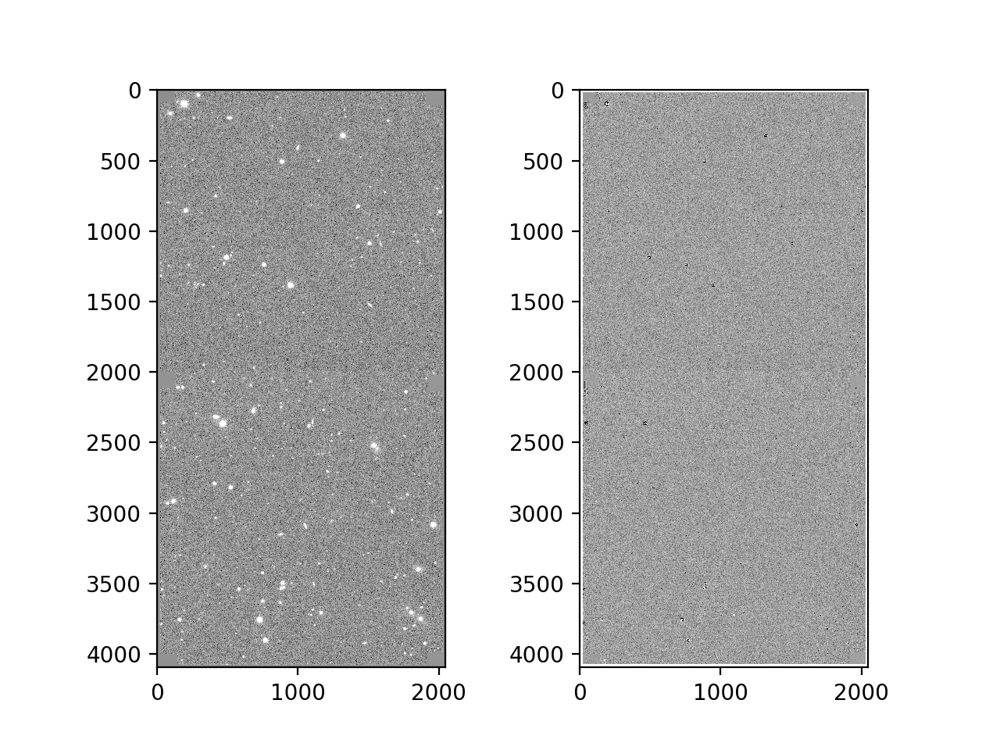

(4096, 2048) (4096, 2048)


In [580]:
uniqueCcdVisitIds = list(set(goodSrc['ccdVisitId'].values))
#uniqueCcdVisitIds = [41102156, 41102156]
print(uniqueCcdVisitIds[0])
print(len(uniqueCcdVisitIds))
for visit in uniqueCcdVisitIds[0:1]:
    fig = plt.figure()
    visit = str(visit)
    dataId = {'visit': int(visit[0:6]), 'ccdnum': int(visit[6:])}
    calexpArray = butler.get('calexp', dataId=dataId).maskedImage.image.getArray()
    diffimArray = butler.get('deepDiff_differenceExp', dataId=dataId).maskedImage.image.getArray()
    calexpNorm = ImageNormalize(calexpArray, interval=ZScaleInterval(), stretch=SqrtStretch())
    diffimNorm = ImageNormalize(diffimArray, interval=ZScaleInterval(), stretch=SqrtStretch())
    fig.add_subplot(121)
    plt.imshow(calexpArray, cmap='gray', norm=calexpNorm)
    fig.add_subplot(122)
    plt.imshow(diffimArray, cmap='gray', norm=diffimNorm)
    print(calexpArray.shape, diffimArray.shape)

## Define a test DIA Object to play with and save some things we might want to loop over

In [581]:
testObjId = goodObj.loc[goodObj['nDiaSources'] > 25, 'diaObjectId'].iloc[0]
testObjRa = goodObj.loc[goodObj['diaObjectId'] == testObjId, 'ra'].values[0]
testObjDec = goodObj.loc[goodObj['diaObjectId'] == testObjId, 'decl'].values[0]
testSrcIds = list(goodSrc.loc[goodSrc['diaObjectId'] == testObjId, 'diaSourceId'].values)
testSrcRas = goodSrc.loc[goodSrc['diaObjectId'] == testObjId, 'ra'].values
testSrcDecs = goodSrc.loc[goodSrc['diaObjectId'] == testObjId, 'decl'].values
testSrcCcdVisitIds = goodSrc.loc[goodSrc['diaObjectId'] == testObjId, 'ccdVisitId'].values
testDataIds = [{'visit': int(str(dataId)[0:6]), 'ccdnum': int(str(dataId)[6:])} for dataId in testSrcCcdVisitIds]
print(testDataIds[0])  # the above is my new favorite list comprehension party

{'visit': 410915, 'ccdnum': 26}


In [582]:
print(testObjId, testObjRa, testObjDec)
print(testSrcCcdVisitIds)

176486760312733865 149.4680320622054 2.339219112543331
[41091526 41097126 41102126 41105526 41125526 41130526 41135526 41140626
 41145626 41165726 41170726 41175826 41180826 41185826 41206026 41225026
 41230726 41250426 41255426 41260426 41265426 41270426 41363526 41368026
 41531426 41536426]


## Let's remember how to do things with the PSF as that will be helpful later

In [591]:
def plotPsfs(butler, ccdVisitIdList, imageType='calexp'):
    fig = plt.figure(figsize=(7, 7))
    for idx, ccdVisitId in enumerate(ccdVisitIdList):
        #dataId = {'visit': visit, 'ccdnum': ccdnum}
        dataId = {'visit': int(str(ccdVisitId)[0:6]), 'ccdnum': int(str(ccdVisitId)[6:])}
        ax = fig.add_subplot(6, 6, idx+1)  # change plot dimensions as needed
        plt.text(0.1, 0.1, ccdVisitId, size=8, transform=ax.transAxes)
        #print(dataId)
        try:
            visitInfo = butler.get(imageType+'_visitInfo', dataId=dataId)
        except:
            print('Cannot access dataId ', dataId)
            continue
        else:
            exposure = butler.get(imageType, dataId=dataId)
            psf = exposure.getPsf()
            psfImage = psf.computeImage().array
            psfSize = psf.computeShape().getDeterminantRadius()
            psfArea = psf.computeShape().getArea()
            center = (psfImage.shape[0]/2, psfImage.shape[1]/2)
            #ax.set_xlim(0,25)
            #ax.set_ylim(0,25)
            ax.set_xlim(center[0] - 15, center[0] + 15)
            ax.set_ylim(center[1] - 15, center[1] + 15)
            ax.set_aspect('equal')
            ax.set_yticklabels([])
            ax.set_xticklabels([])
            #plt.axes([0, 30, 0, 30])
            plt.subplots_adjust(hspace=0, wspace=0)
            plt.imshow(psfImage, cmap='Purples')  # purple!
            print(dataId, psfSize, psfArea)

<IPython.core.display.Javascript object>


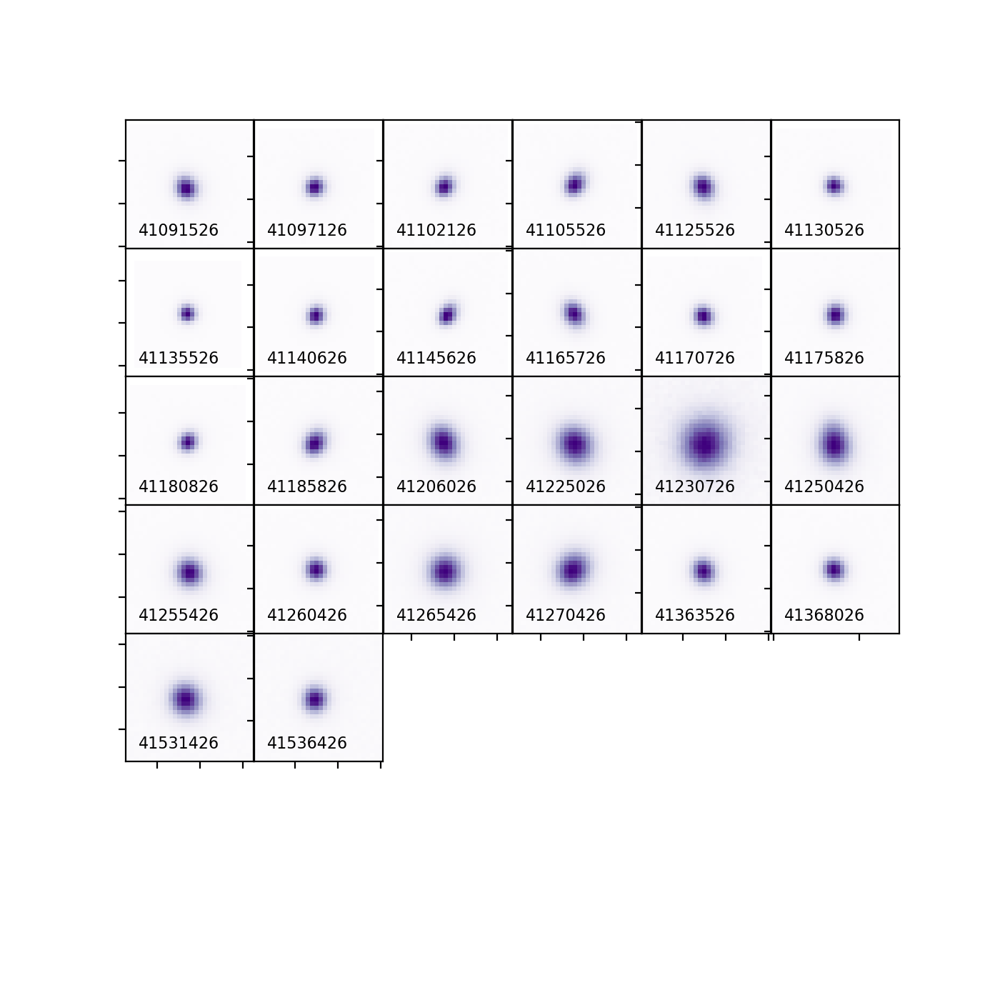

{'visit': 410915, 'ccdnum': 26} 1.9381506915123619 11.801166932153976
{'visit': 410971, 'ccdnum': 26} 1.6592097185168446 8.648731973191653
{'visit': 411021, 'ccdnum': 26} 1.7311184853077164 9.414634418372291
{'visit': 411055, 'ccdnum': 26} 1.880249719694481 11.106595056773967
{'visit': 411255, 'ccdnum': 26} 2.04811779095754 13.178310406654294
{'visit': 411305, 'ccdnum': 26} 1.597769894807362 8.020073354802161
{'visit': 411355, 'ccdnum': 26} 1.4136231949924212 6.277940535804641
{'visit': 411406, 'ccdnum': 26} 1.5550216954189466 7.596661549580084
{'visit': 411456, 'ccdnum': 26} 1.6563057190839185 8.618483918171801
{'visit': 411657, 'ccdnum': 26} 2.021531162336942 12.83839559397087
{'visit': 411707, 'ccdnum': 26} 1.7088275753935032 9.17373857731579
{'visit': 411758, 'ccdnum': 26} 1.7894720603273166 10.060040211390575
{'visit': 411808, 'ccdnum': 26} 1.6433716973980734 8.484406715064043
{'visit': 411858, 'ccdnum': 26} 2.036439448778859 13.02845374443769
{'visit': 412060, 'ccdnum': 26} 2.911

In [592]:
plotPsfs(butler, testSrcCcdVisitIds, imageType='calexp')

## Plot cutouts with DIA Object and DIA Source positions on top
Helpful reference, aka the only "documentation" I know of for afwDisplay in matplotlib: 
https://nbviewer.jupyter.org/github/RobertLuptonTheGood/notebooks/blob/master/Demos/Image%20Processing.ipynb

In [593]:
testsrc = butler.get('src', dataId=testDataIds[0])

In [594]:
print(type(testsrc[0].getCentroid()), testsrc[0].getCentroid())  # so Robert's disp.dot expects a pixel x,y point

<class 'lsst.geom.Point2D'> (574.03, 17.484)


In [595]:
def plotSourceLocationsOnObject(objId, objTable, srcTable, repo, plotIdx=1):
    '''Given a DIA Object ID, plot the differencing template used for this object in a 
    postage stamp cutout, and overplot the location of the object and all constituent sources,
    assuming those sources are in the provided source table.
    NOTE: the source table is assumed to have flag fields added to it already, a la makeSrcTableFlags
    '''
    objRa = objTable.loc[objTable['diaObjectId'] == objId, 'ra'].values[0]
    objDec = objTable.loc[objTable['diaObjectId'] == objId, 'decl'].values[0]
    srcIds = list(srcTable.loc[srcTable['diaObjectId'] == objId, 'diaSourceId'].values)
    srcRas = srcTable.loc[srcTable['diaObjectId'] == objId, 'ra'].values
    srcDecs = srcTable.loc[srcTable['diaObjectId'] == objId, 'decl'].values
    srcCcdVisitIds = srcTable.loc[srcTable['diaObjectId'] == objId, 'ccdVisitId'].values
    dataIds = [{'visit': int(str(dataId)[0:6]), 'ccdnum': int(str(dataId)[6:])} for dataId in srcCcdVisitIds]
    
    objLoc = lsst.geom.SpherePoint(objRa, objDec, lsst.geom.degrees)
    calexpFirst = butler.get('calexp', dataId=dataIds[0])
    templateCutout = plc.getTemplateCutout(calexpFirst, repo, objLoc)
    wcs = templateCutout.getWcs()
    
    disp = afwDisplay.Display(plotIdx, reopenPlot=True)
    disp.setMaskTransparency(100)
    disp.scale('asinh', 'zscale', Q=4)
    disp.mtv(templateCutout, title=objId)
    
    flagFilter = ((srcTable['base_PixelFlags_flag_bad']) | 
                  (srcTable['base_PixelFlags_flag_suspect']) |
                  (srcTable['base_PixelFlags_flag_saturatedCenter']) |
                  (srcTable['slot_Shape_flag'])
                 )
    noFlagFilter = ~flagFilter
    goodSrc = srcTable.loc[noFlagFilter]

    with disp.Buffering():  # obviously
        coordObj = wcs.skyToPixel(objLoc)
        disp.dot('+', *coordObj, ctype='C0', size=5)
        for dataId, srcId, ra, dec in zip(dataIds, srcIds, srcRas, srcDecs):
            calexp = butler.get('calexp', dataId=dataId)
            psf = calexp.getPsf()
            psfSize = psf.computeShape().getDeterminantRadius()
            coordSrc = wcs.skyToPixel(lsst.geom.SpherePoint(ra, dec, lsst.geom.degrees))
            if srcId in goodSrc['diaSourceId'].values:
                disp.dot('o', *coordSrc, ctype='C3', size=psfSize)  # green
            else:
                disp.dot('o', *coordSrc, ctype='C2', size=psfSize)  # red

Template dataId {'tract': 0, 'patch': '40,47', 'filter': 'g'}


<IPython.core.display.Javascript object>


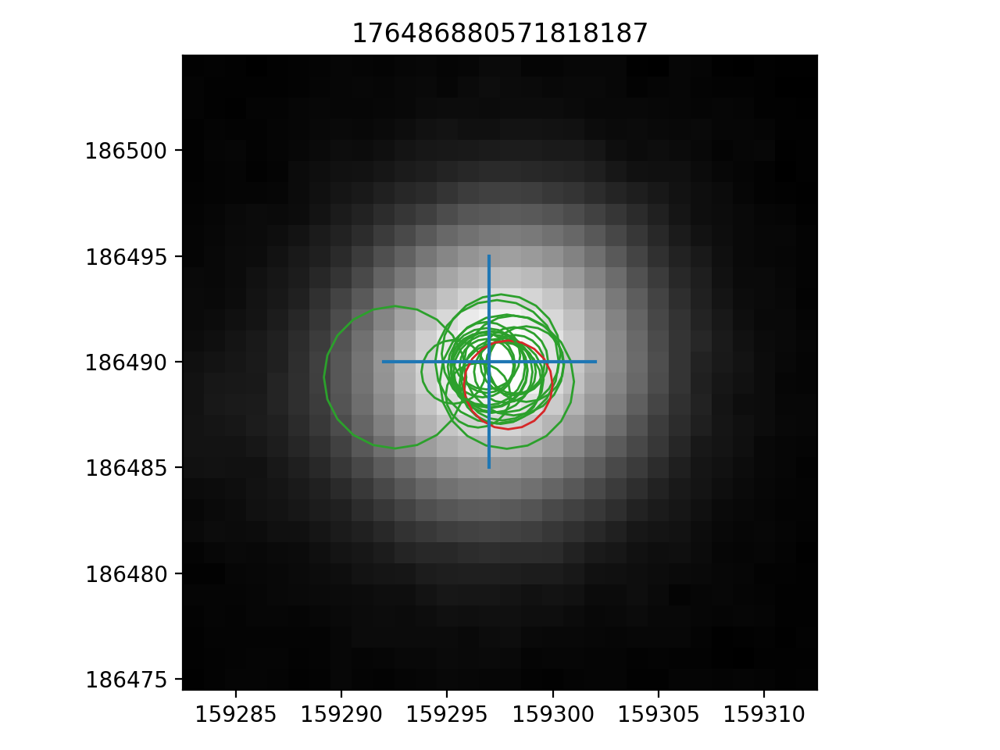

Template dataId {'tract': 0, 'patch': '45,51', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


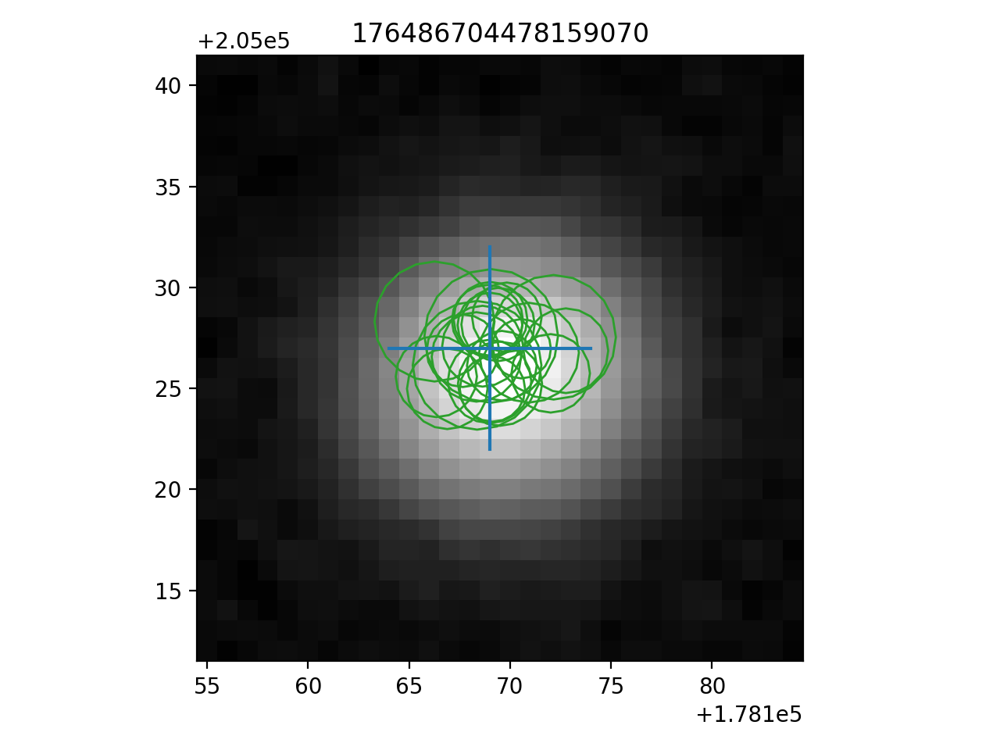

Template dataId {'tract': 0, 'patch': '39,52', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


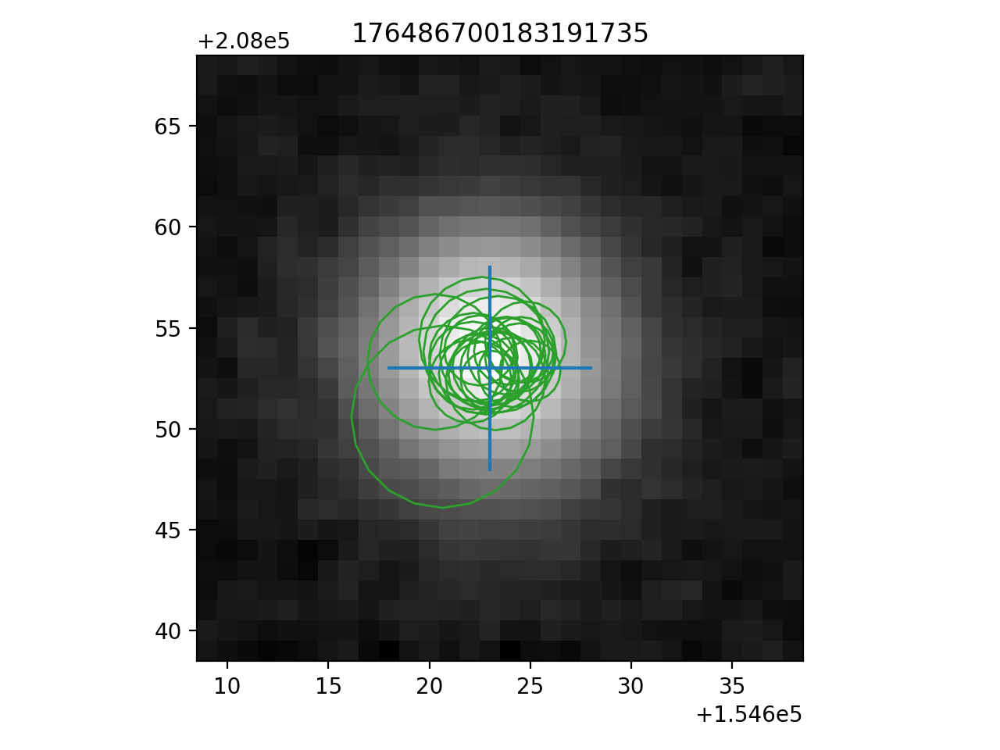

Template dataId {'tract': 0, 'patch': '43,50', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


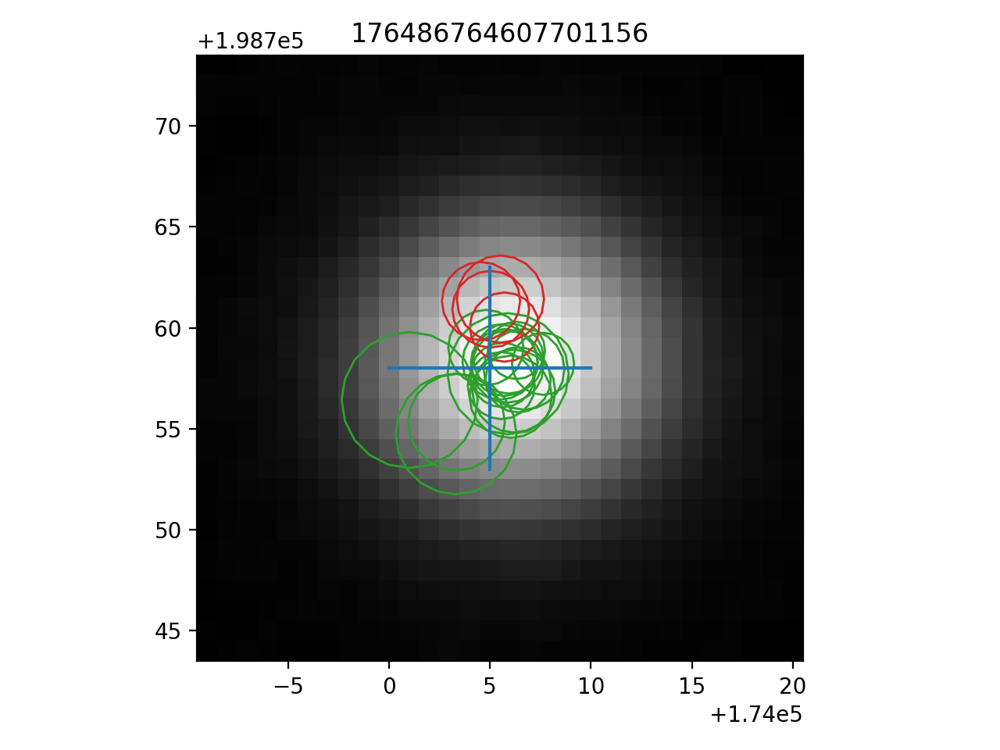

Template dataId {'tract': 0, 'patch': '21,14', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


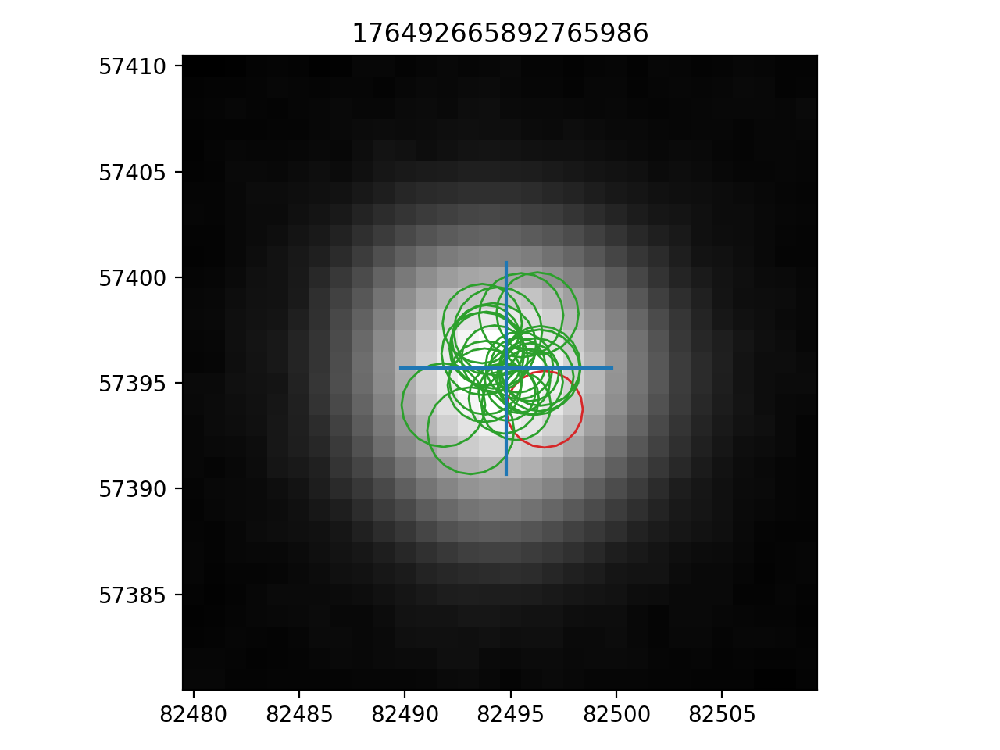

Template dataId {'tract': 0, 'patch': '43,46', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


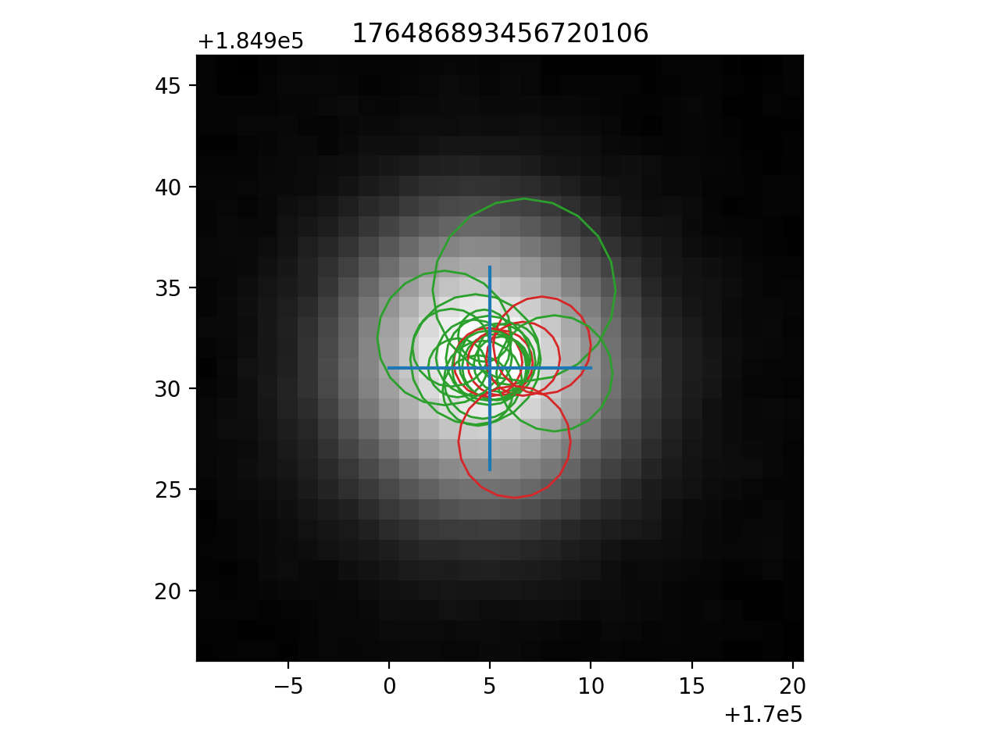

Template dataId {'tract': 0, 'patch': '43,53', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


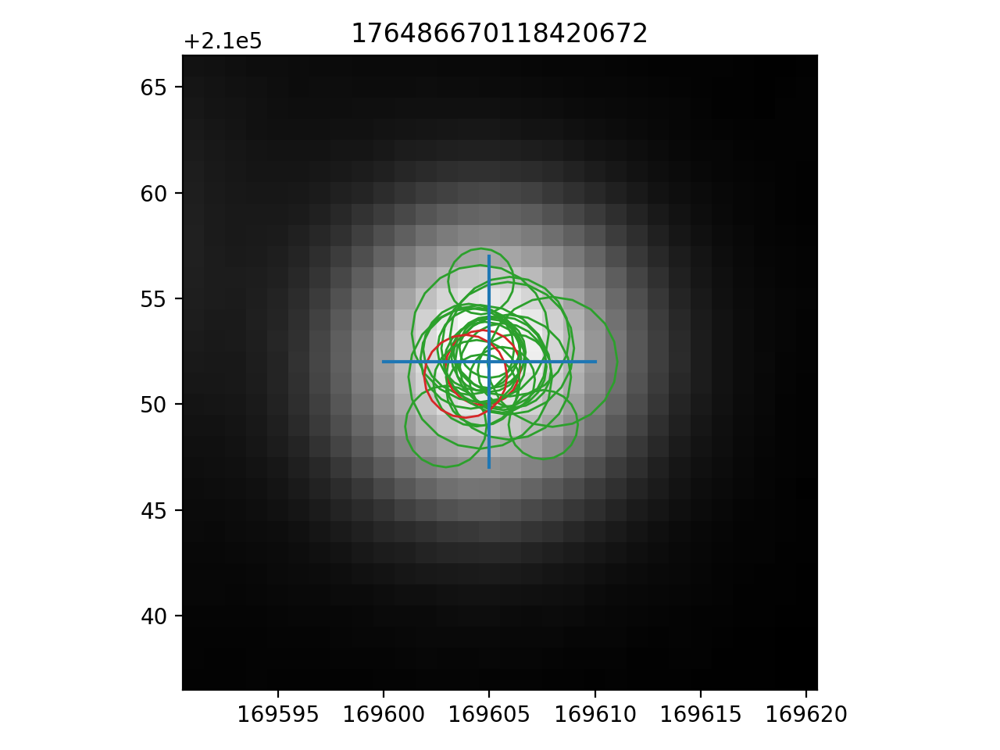

Template dataId {'tract': 0, 'patch': '45,47', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


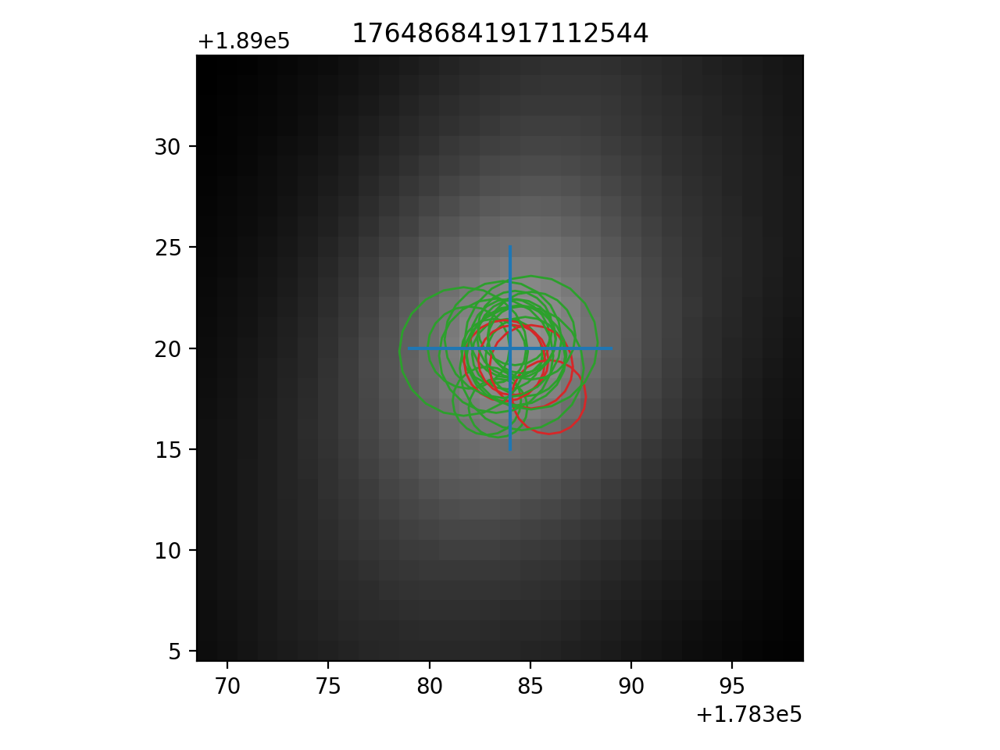

Template dataId {'tract': 0, 'patch': '45,47', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


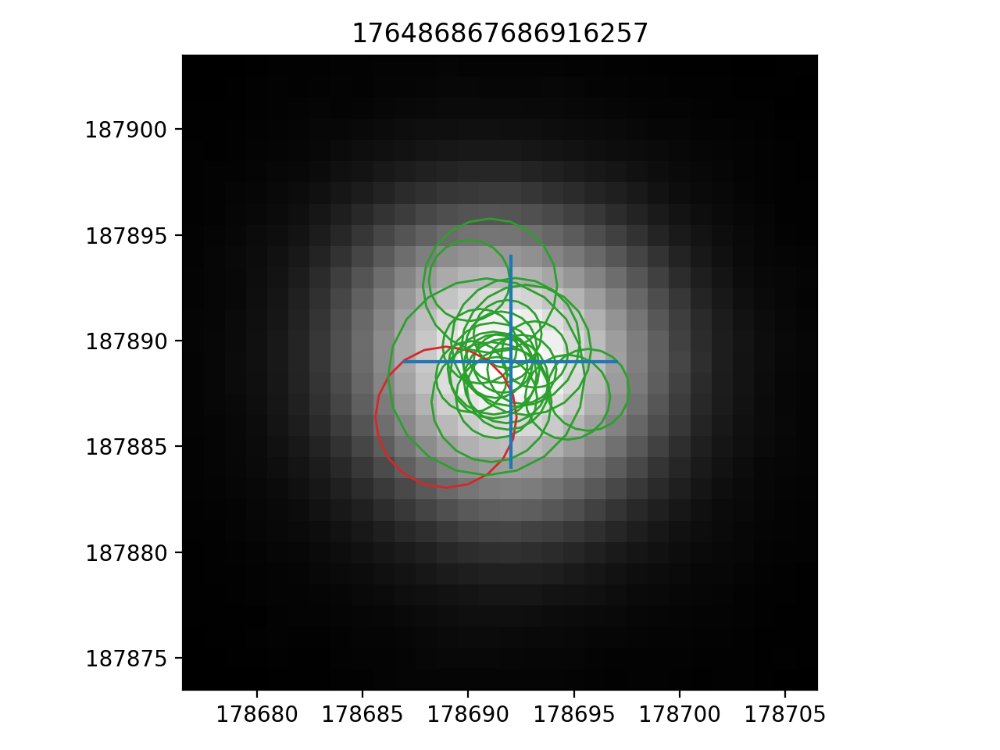

Template dataId {'tract': 0, 'patch': '19,12', 'filter': 'g'}


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


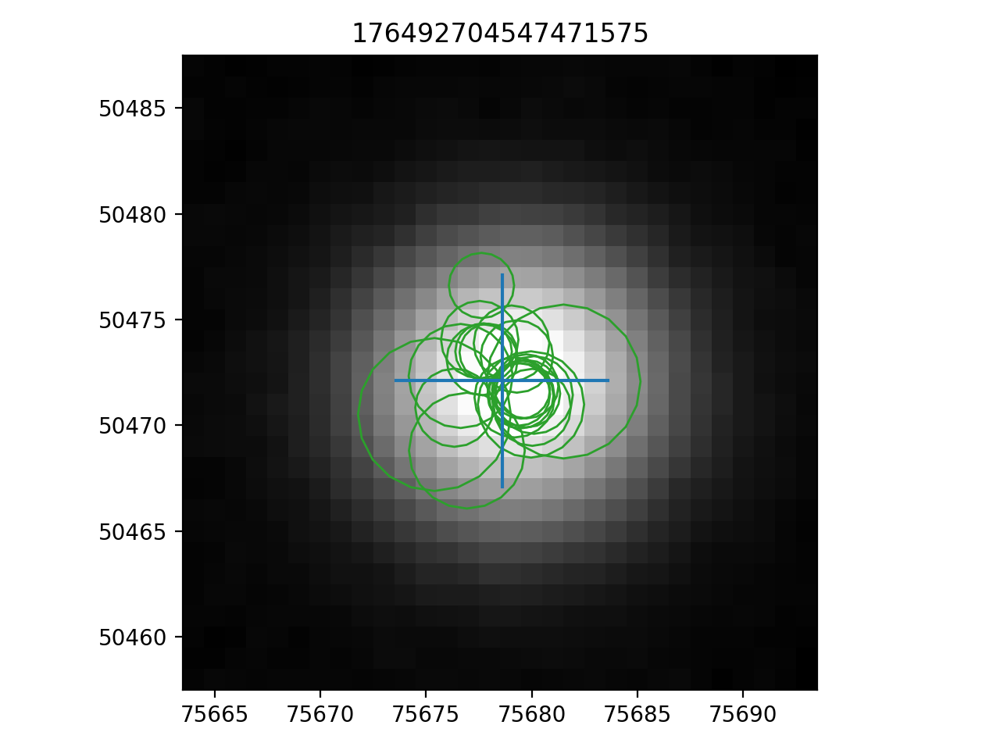

In [596]:
for idx, objId in enumerate(goodObj.loc[goodObj['nDiaSources'] > 20, 'diaObjectId'].iloc[0:10]):
    plotSourceLocationsOnObject(objId, goodObj, srcTableFlags, repo, plotIdx=idx)

### OK now that was interesting!
Lots of the "good" objects have lots of constituent "bad" sources, which we already knew. But the DIA Object position is the average of **all** of them. The source position moves around kind of a lot, which is why the forced photometry light curves tend to be such a mess. It's not obviously a function of good/bad (green/red) source or PSF size.

### Let's plot cutouts for all the sources just so we have that to stare at, too

Loading PPDB Sources...
DIAObject ID: 176486880571818187
RA (deg): [150.52484254]
Dec (deg): [1.61479428]
Number of DIASources: 21


/opt/lsst/software/stack/python/miniconda3-4.5.12/envs/lsst-scipipe-1172c30/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


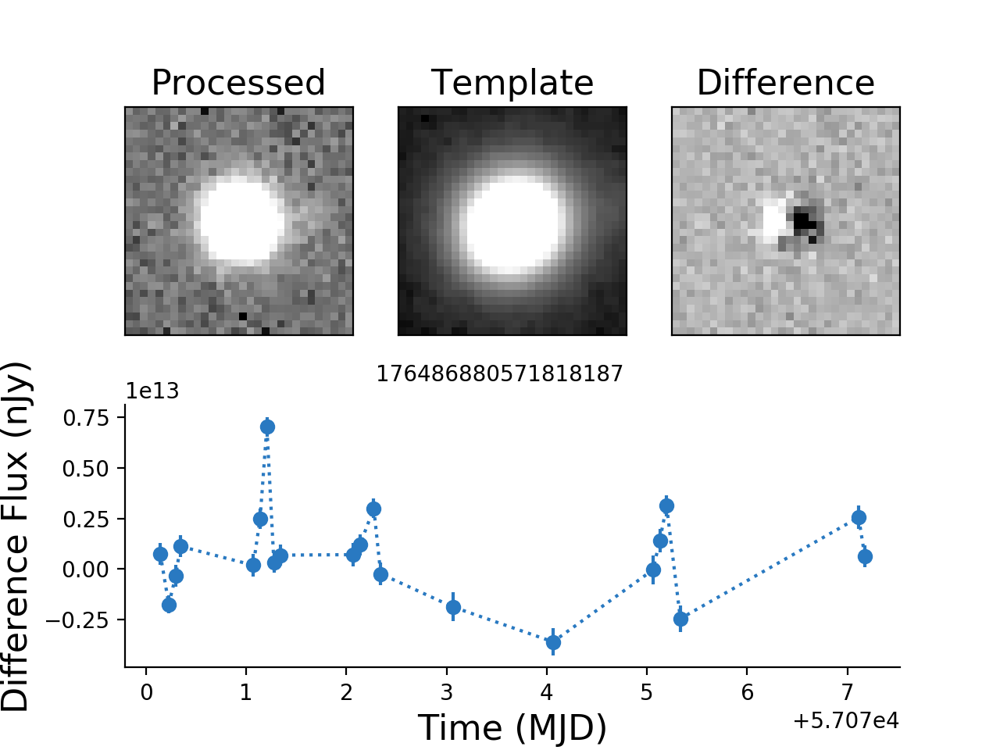

Template dataId {'tract': 0, 'patch': '40,47', 'filter': 'g'}


<IPython.core.display.Javascript object>


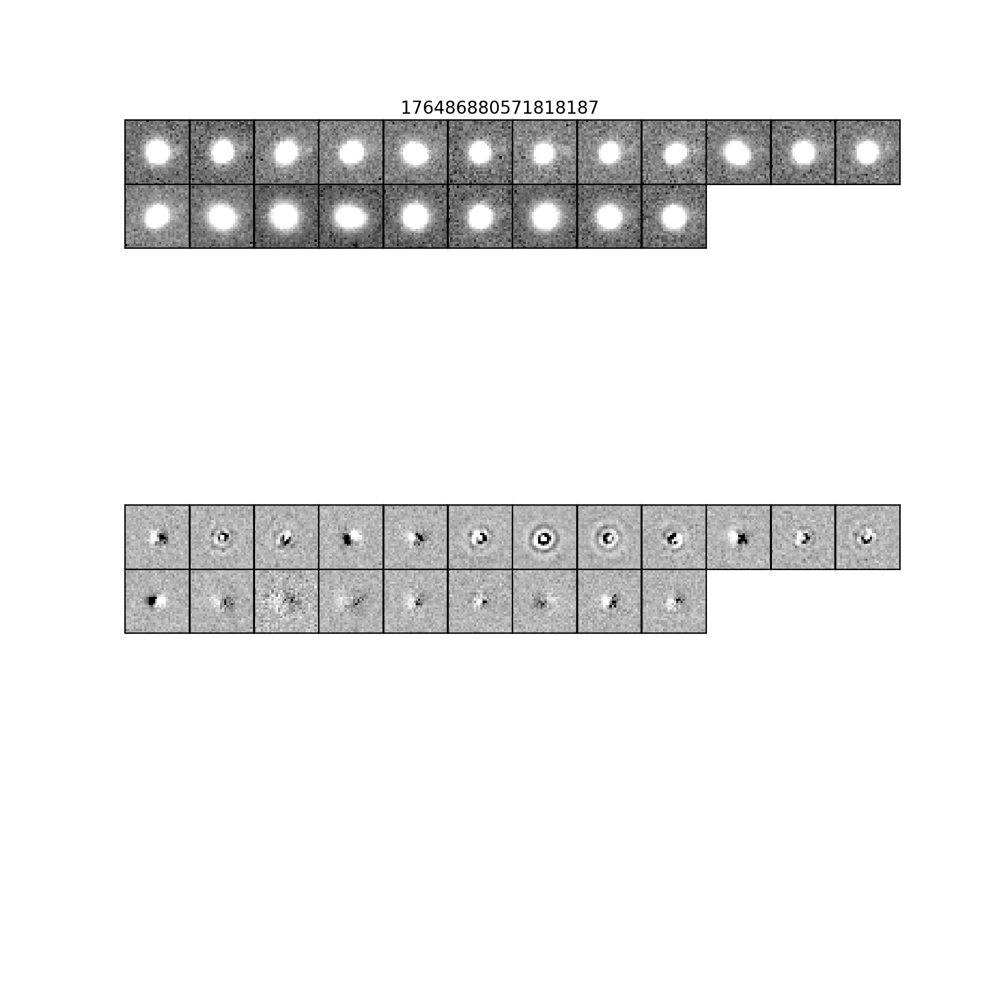

Loading PPDB Sources...
DIAObject ID: 176486704478159070
RA (deg): [149.47798167]
Dec (deg): [2.64248498]
Number of DIASources: 22


<IPython.core.display.Javascript object>


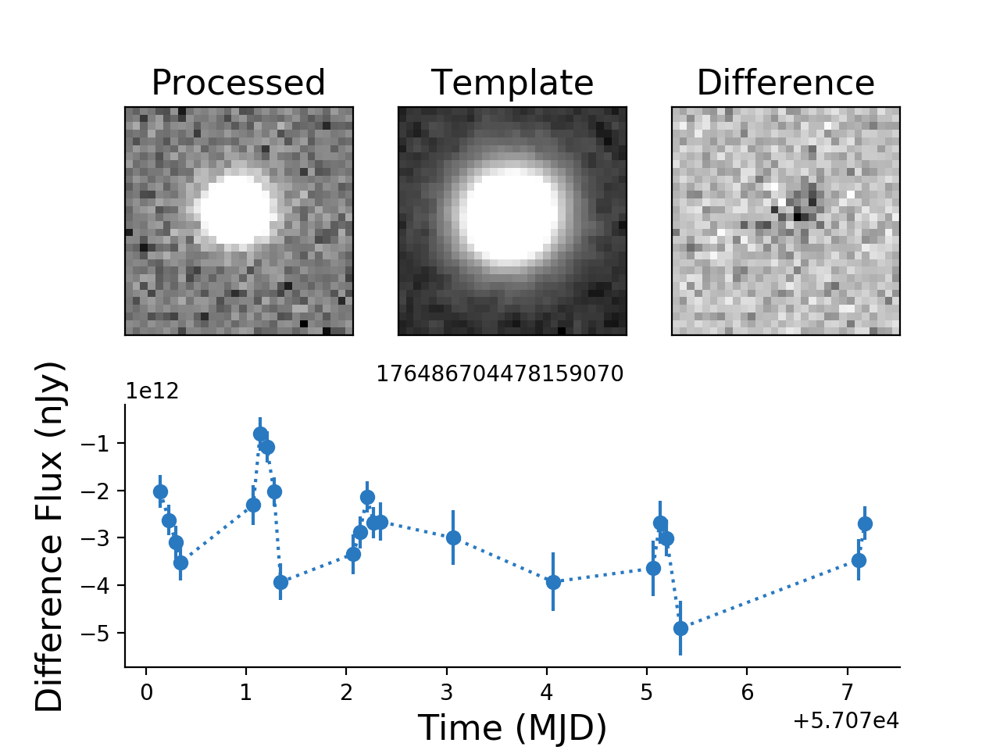

Template dataId {'tract': 0, 'patch': '45,51', 'filter': 'g'}


<IPython.core.display.Javascript object>


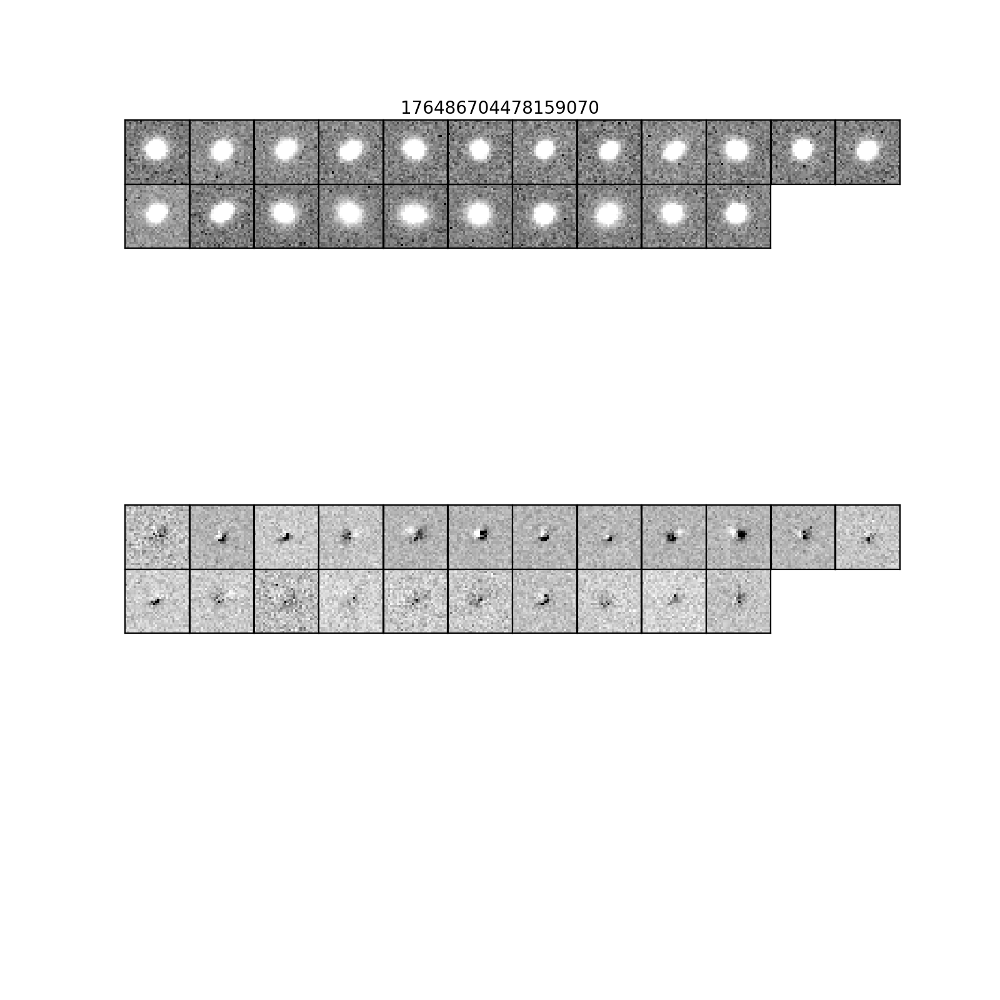

Loading PPDB Sources...
DIAObject ID: 176486700183191735
RA (deg): [150.78424547]
Dec (deg): [2.81042375]
Number of DIASources: 22


<IPython.core.display.Javascript object>


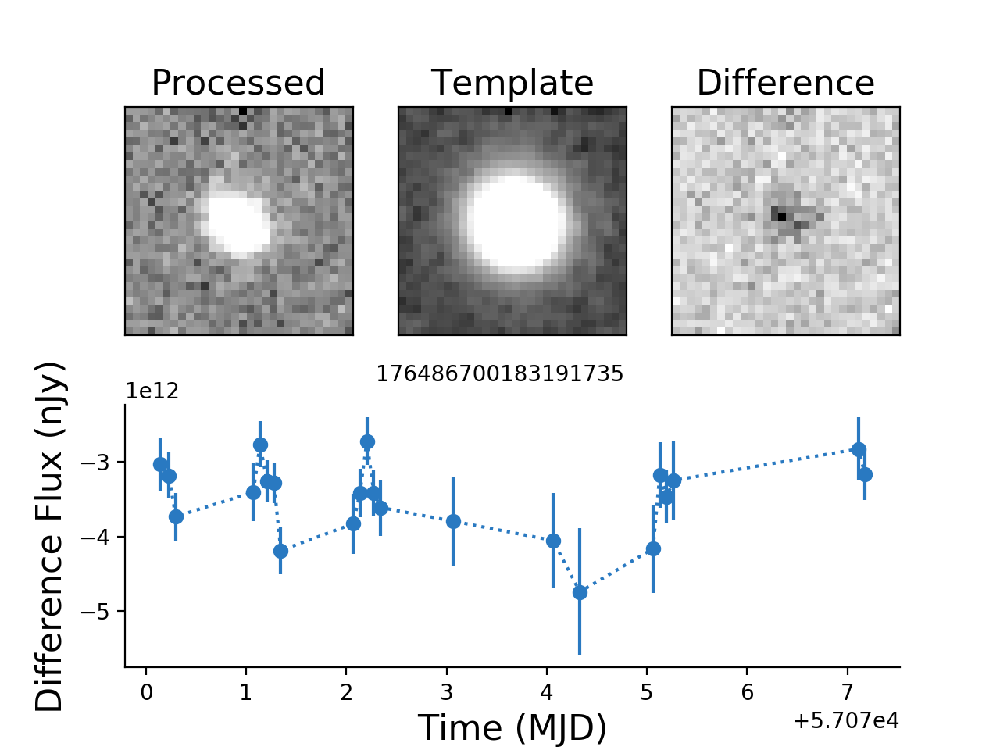

Template dataId {'tract': 0, 'patch': '39,52', 'filter': 'g'}


<IPython.core.display.Javascript object>


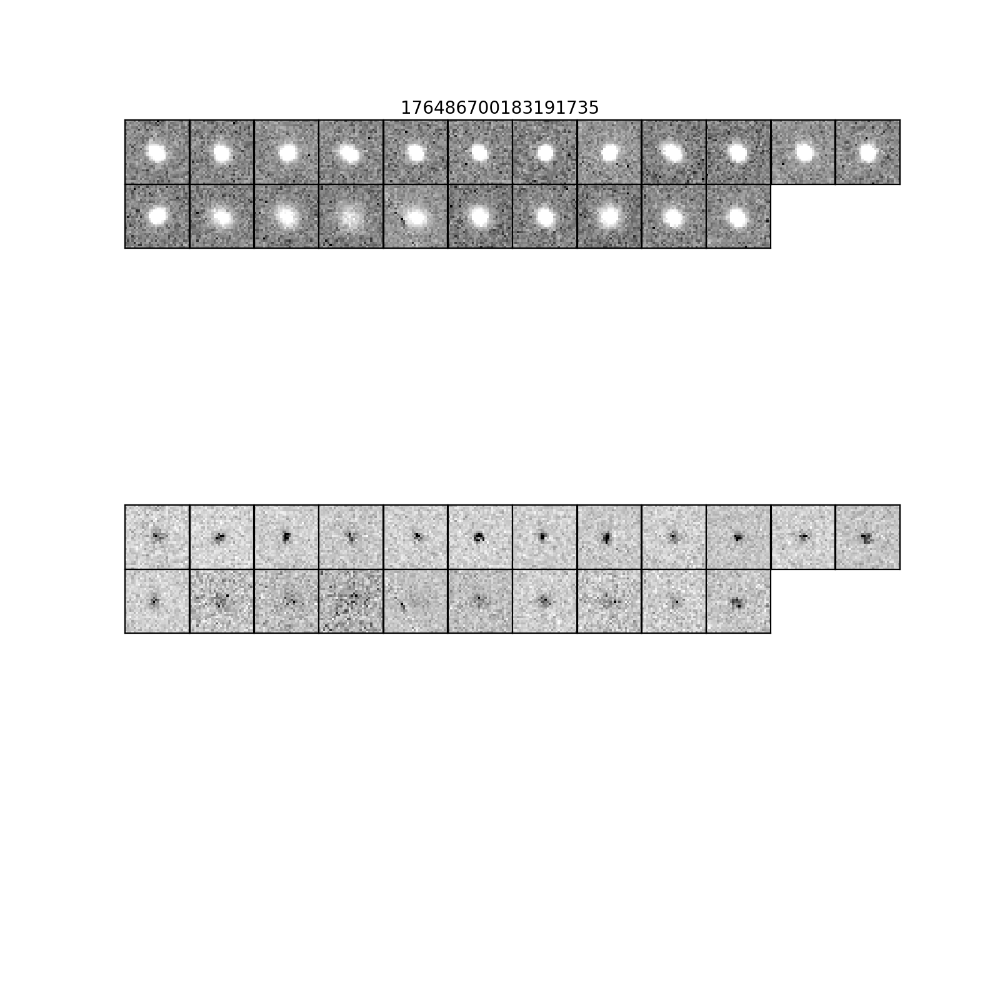

Loading PPDB Sources...
DIAObject ID: 176486764607701156
RA (deg): [149.70895681]
Dec (deg): [2.29514158]
Number of DIASources: 21


<IPython.core.display.Javascript object>


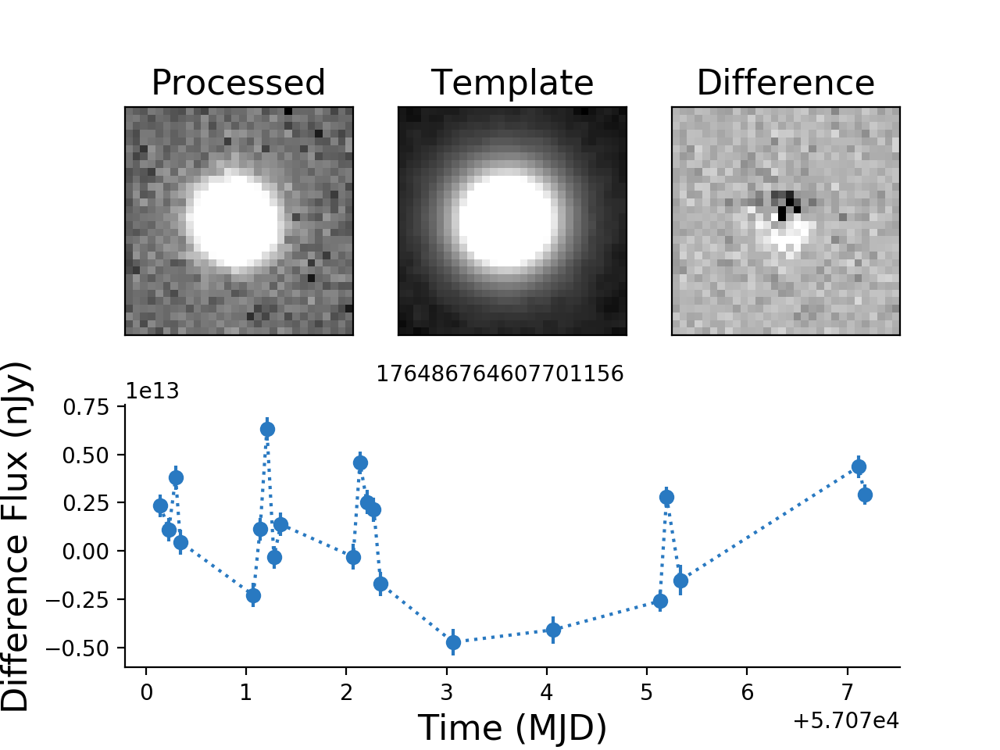

Template dataId {'tract': 0, 'patch': '43,50', 'filter': 'g'}


<IPython.core.display.Javascript object>


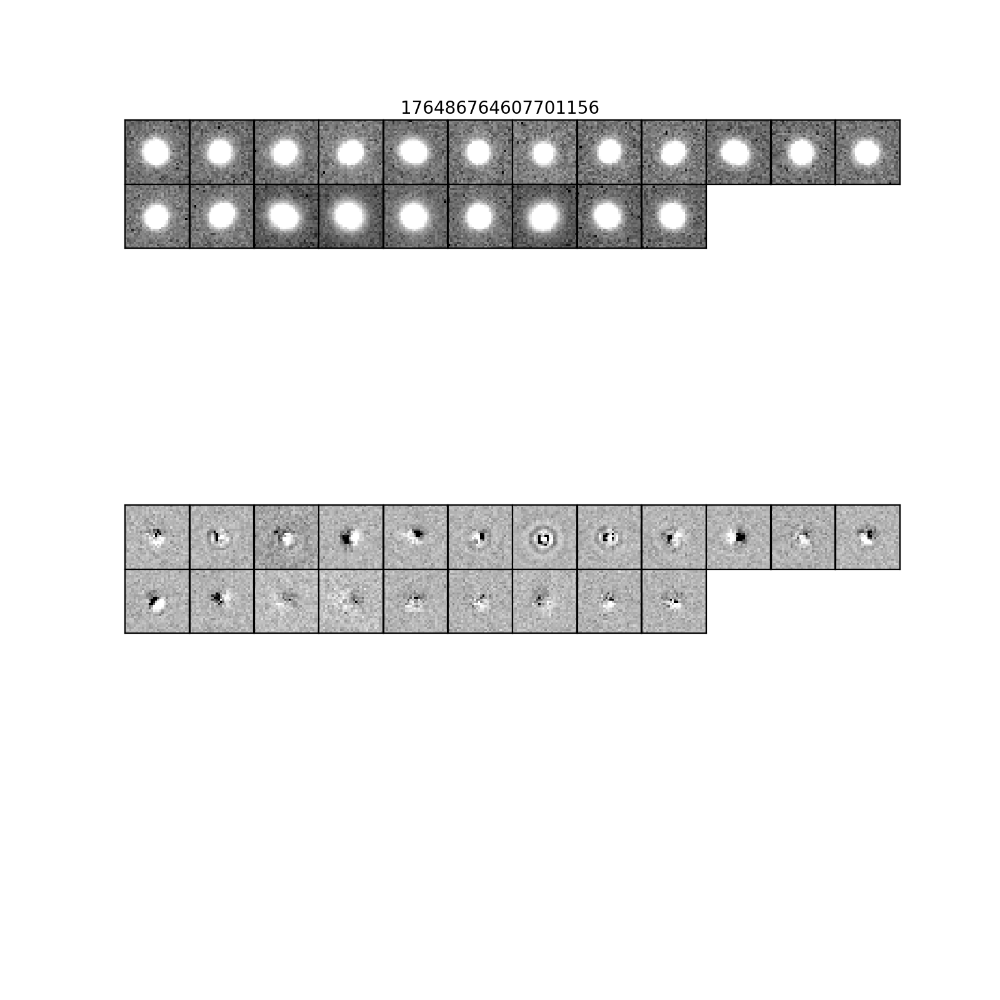

Loading PPDB Sources...
DIAObject ID: 176492665892765986
RA (deg): [154.79653886]
Dec (deg): [-5.55291401]
Number of DIASources: 25


<IPython.core.display.Javascript object>


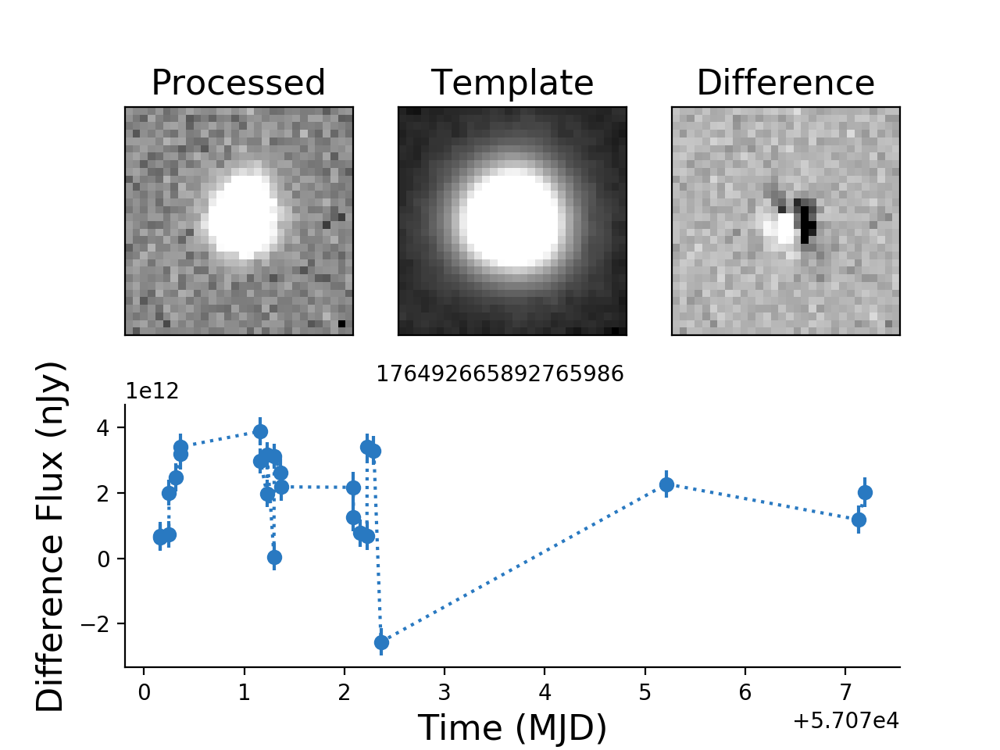

Template dataId {'tract': 0, 'patch': '21,14', 'filter': 'g'}


<IPython.core.display.Javascript object>


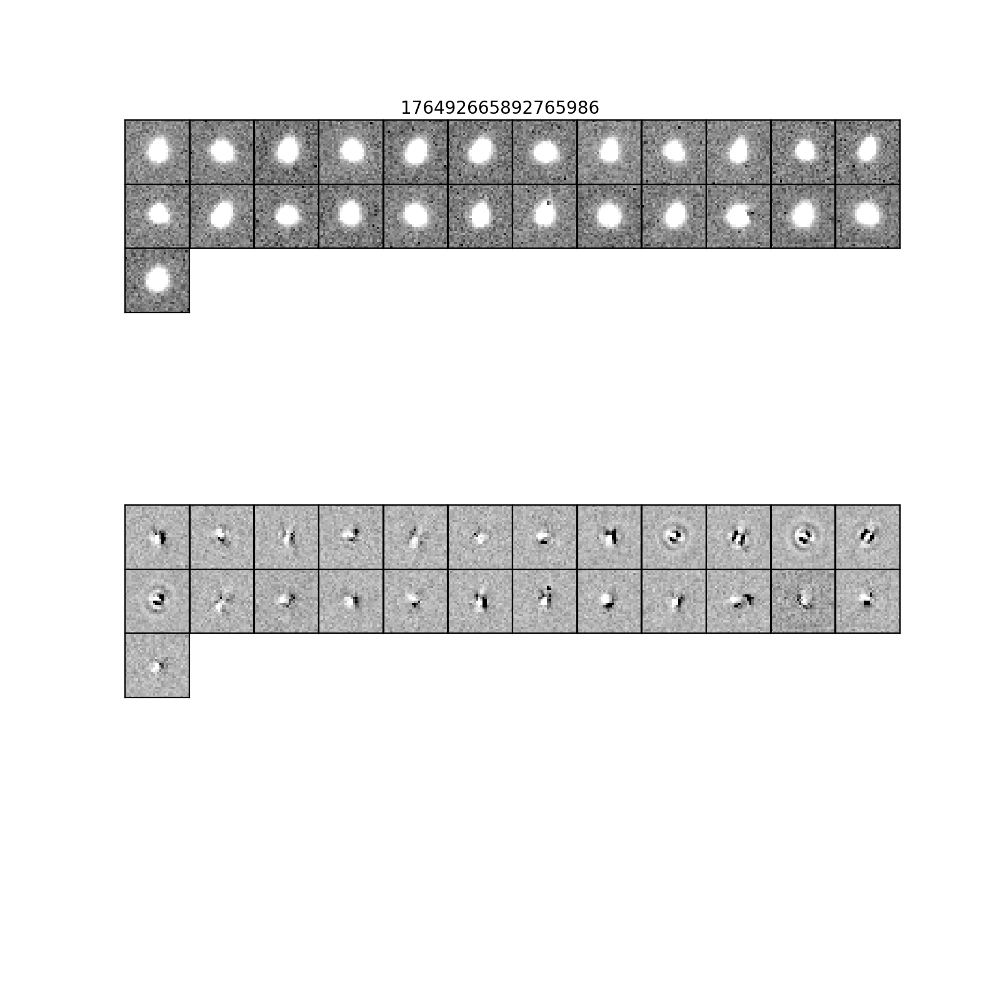

Loading PPDB Sources...
DIAObject ID: 176486893456720106
RA (deg): [149.93070961]
Dec (deg): [1.52855123]
Number of DIASources: 21


<IPython.core.display.Javascript object>


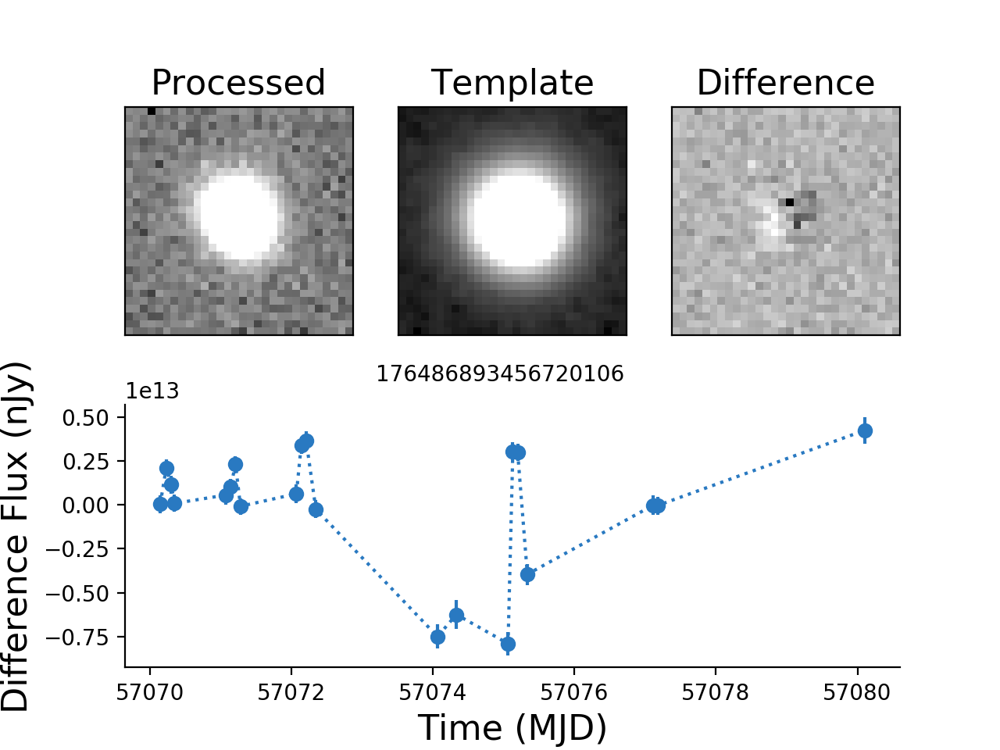

Template dataId {'tract': 0, 'patch': '43,46', 'filter': 'g'}


<IPython.core.display.Javascript object>


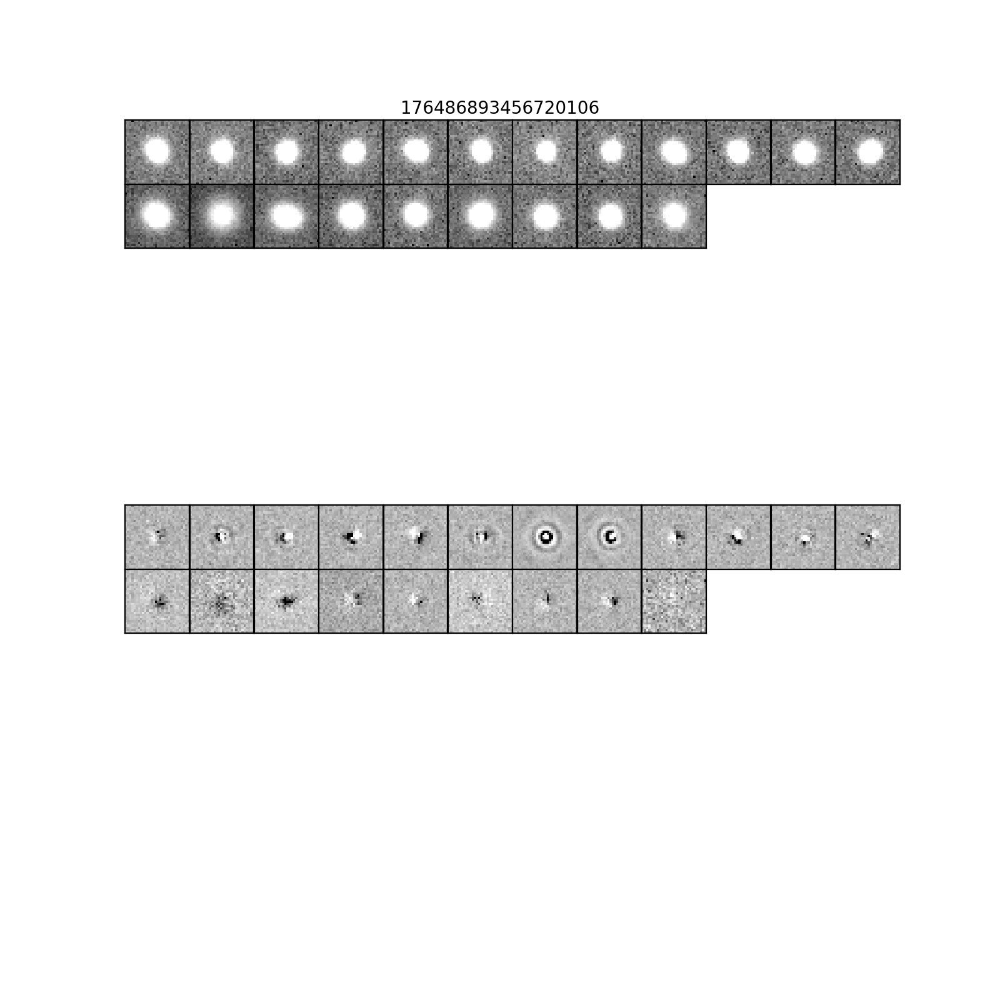

Loading PPDB Sources...
DIAObject ID: 176486670118420672
RA (deg): [149.95295197]
Dec (deg): [2.92099777]
Number of DIASources: 24


<IPython.core.display.Javascript object>


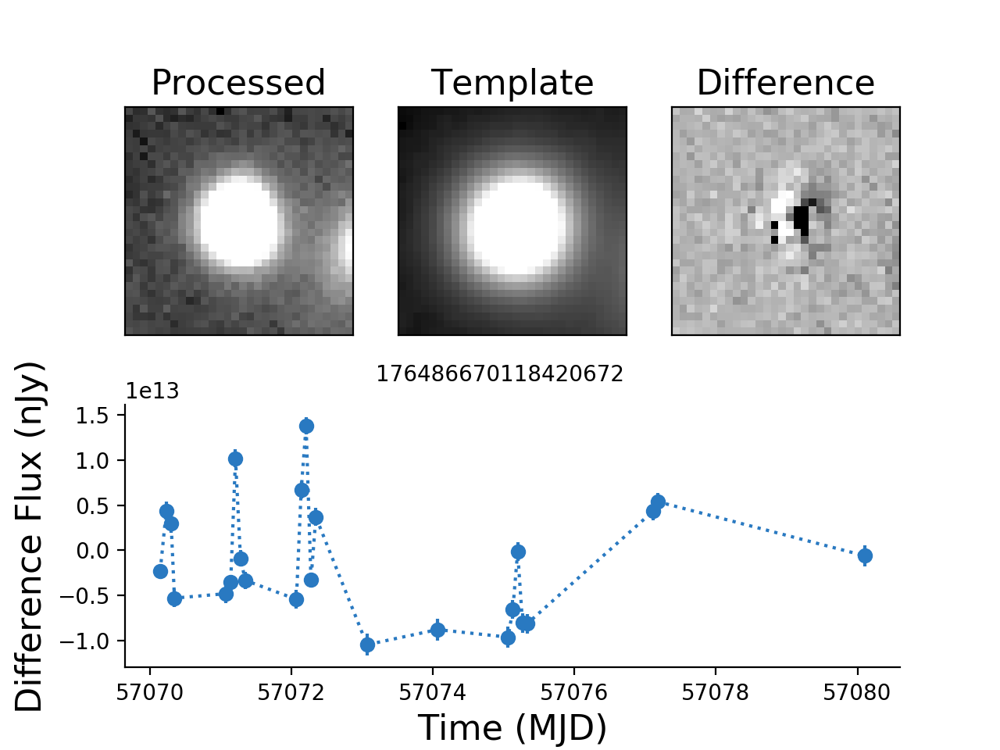

Template dataId {'tract': 0, 'patch': '43,53', 'filter': 'g'}


<IPython.core.display.Javascript object>


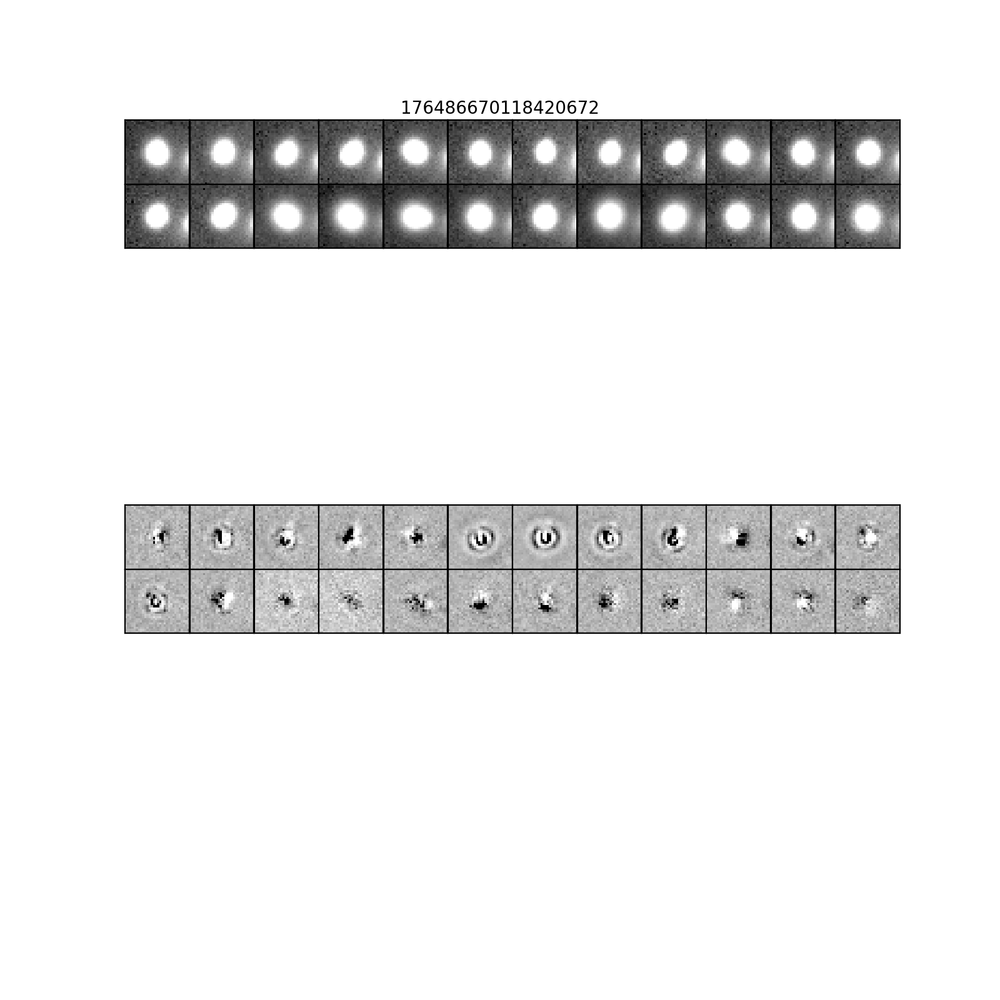

Loading PPDB Sources...
DIAObject ID: 176486841917112544
RA (deg): [149.4660245]
Dec (deg): [1.75537455]
Number of DIASources: 21


<IPython.core.display.Javascript object>


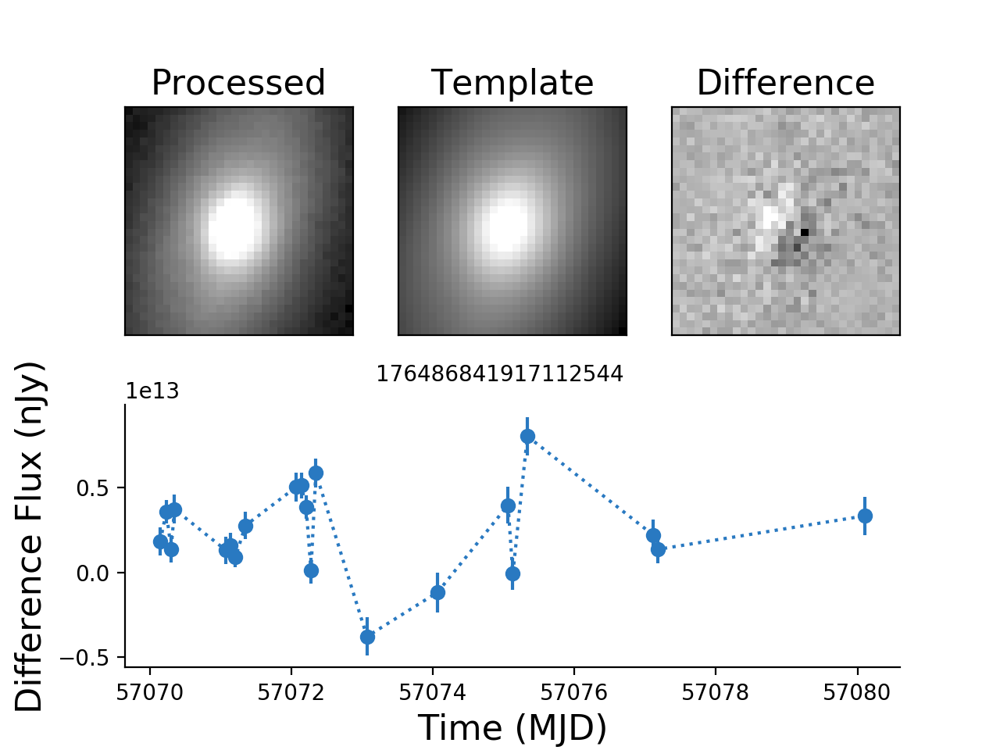

Template dataId {'tract': 0, 'patch': '45,47', 'filter': 'g'}


<IPython.core.display.Javascript object>


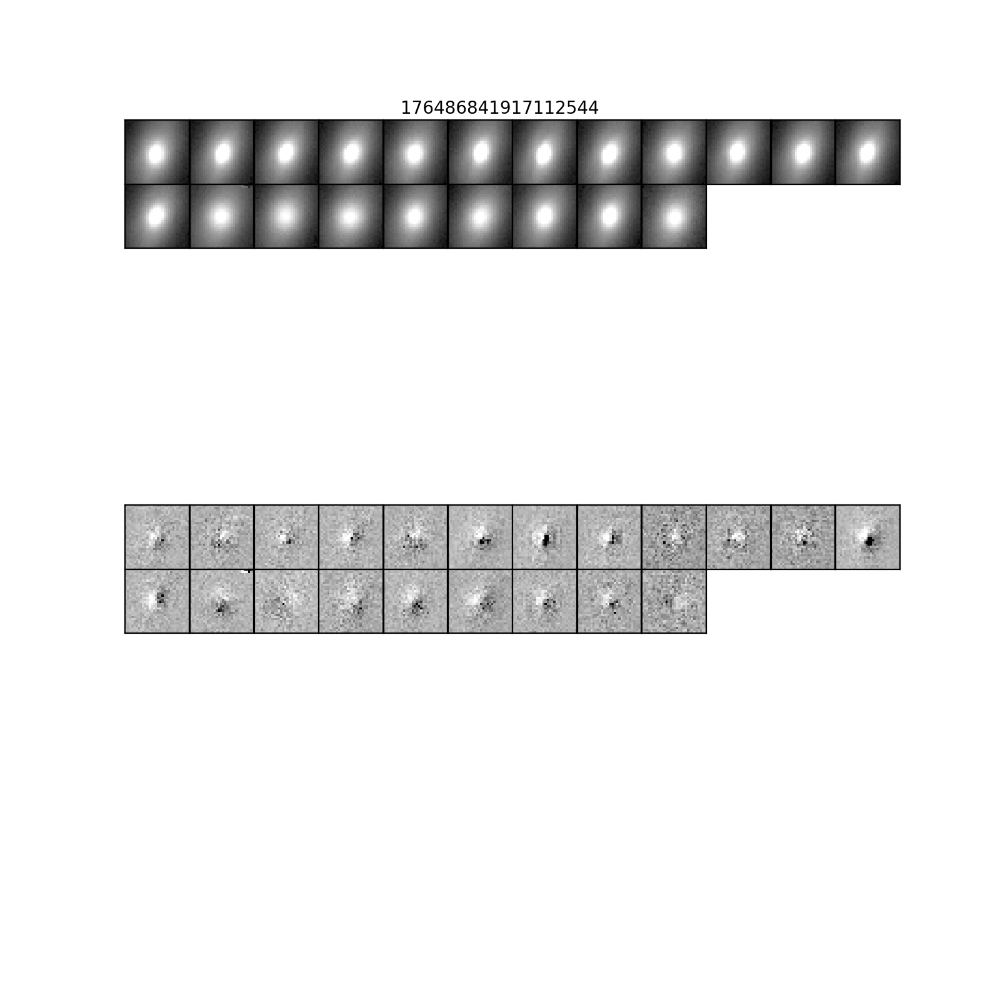

Loading PPDB Sources...
DIAObject ID: 176486867686916257
RA (deg): [149.44893905]
Dec (deg): [1.6926998]
Number of DIASources: 22


<IPython.core.display.Javascript object>


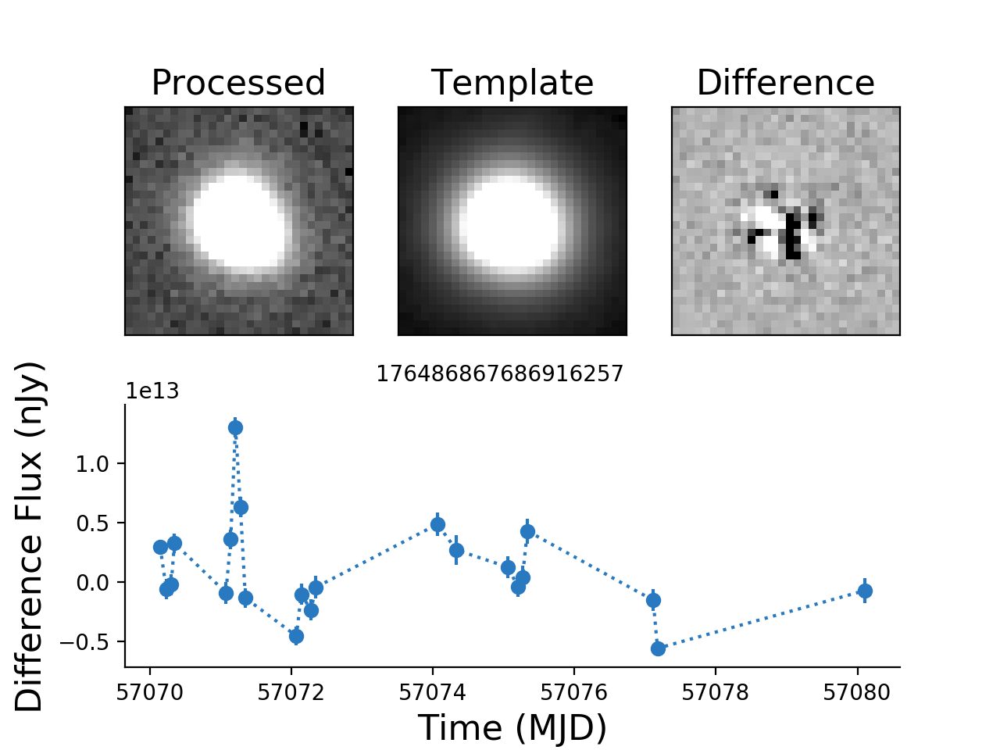

Template dataId {'tract': 0, 'patch': '45,47', 'filter': 'g'}


<IPython.core.display.Javascript object>


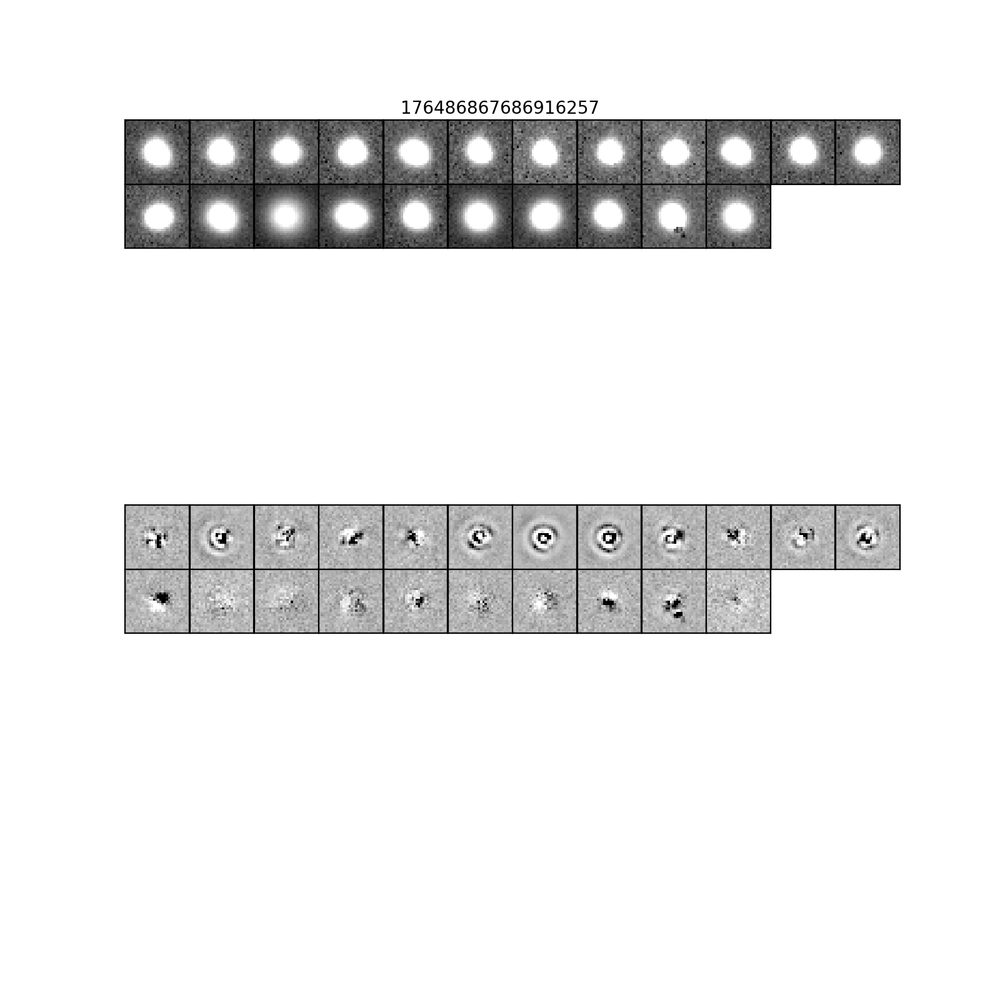

Loading PPDB Sources...
DIAObject ID: 176492704547471575
RA (deg): [155.1776359]
Dec (deg): [-5.93612835]
Number of DIASources: 21


<IPython.core.display.Javascript object>


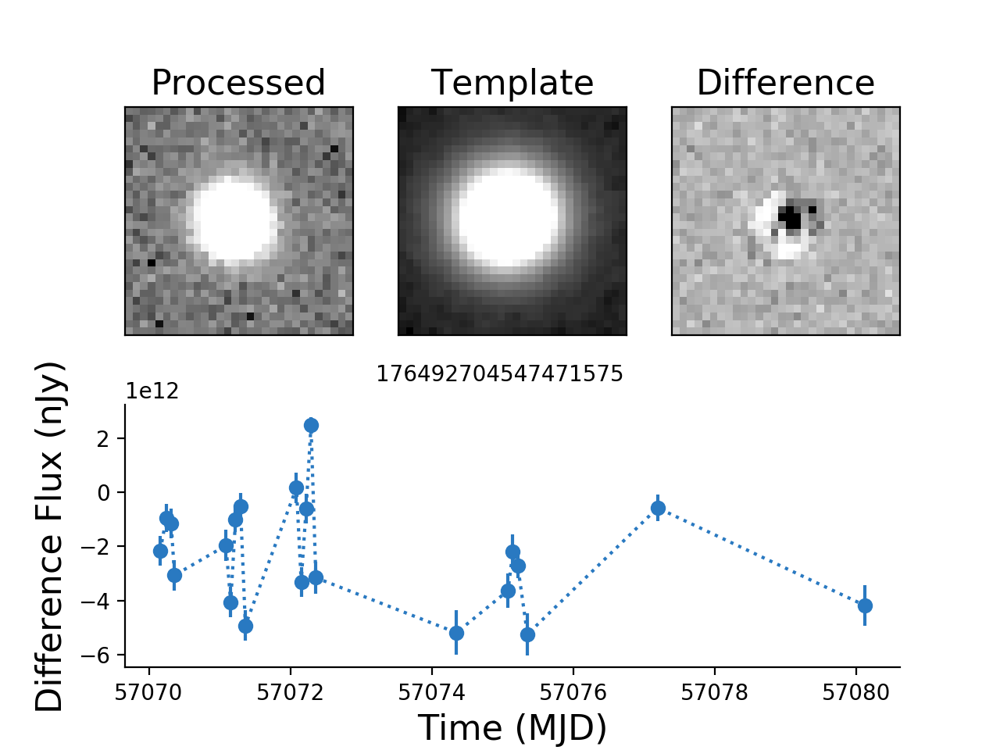

Template dataId {'tract': 0, 'patch': '19,12', 'filter': 'g'}


<IPython.core.display.Javascript object>


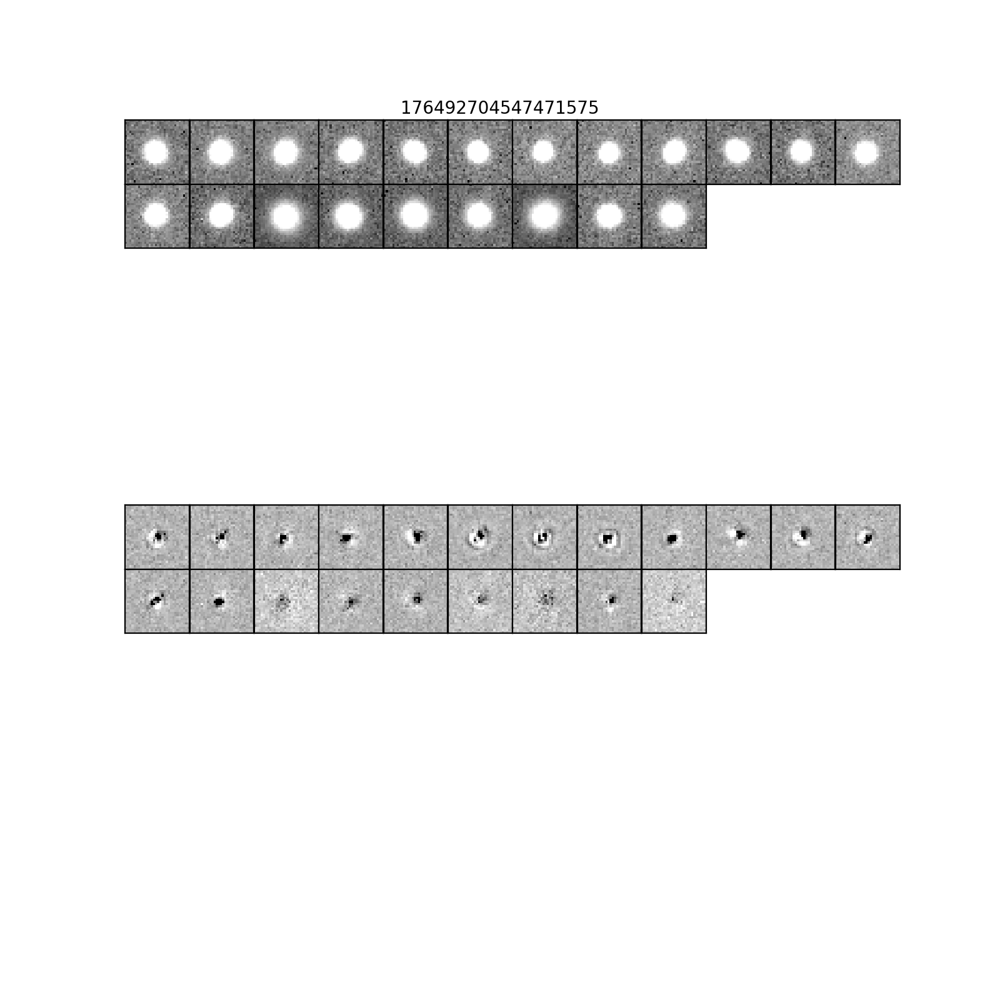

In [597]:
for objId in goodObj.loc[goodObj['nDiaSources'] > 20, 'diaObjectId'].iloc[0:10]:
    plc.plotLightcurve(objId, goodObj, repo, dbPath, repo, plotAllCutouts=True)

## Side quest time!

### Can we use a different shape plugin that doesn't throw out negative sources? (yes we can)

In [415]:
# Looking at a repo with SimpleShape instead of SdssShape in differencing, for flag purposes
# In this repo, ap_pipe was only run on 5 visits and 1 ccd
repoMini = '/project/mrawls/hits2015/rerun/simpleShape1'
butlerMini = dafPersist.Butler(repoMini)
dbNameMini = 'association.db'
dbPathMini = os.path.join(repoMini, dbNameMini)

In [416]:
objTableMini = loadAllPpdbObjects(repoMini, dbNameMini)
srcTableMini = loadAllPpdbSources(repoMini, dbNameMini)

In [432]:
def makeSrcTableFlagsMini(srcTbl, objTbl):
    config = MapDiaSourceConfig()  # note this will include the usual flag bits that don't exist now
    unpacker = UnpackPpdbFlags(config.flagMap, 'DiaSource')
    flagValues = unpacker.unpack(srcTbl['flags'], 'flags')
    flagTable = pd.DataFrame(flagValues, index=srcTbl.index)
    srcTableFlags = pd.merge(srcTbl, flagTable, left_index=True, right_index=True)
    flagFilter = ((srcTableFlags['base_PixelFlags_flag_bad']) | 
                  (srcTableFlags['base_PixelFlags_flag_suspect']) |
                  (srcTableFlags['base_PixelFlags_flag_saturatedCenter']) |
                  (srcTableFlags['slot_Shape_flag'])
                 )
    noFlagFilter = ~flagFilter
    goodSrc = srcTableFlags.loc[noFlagFilter]
    goodObjIds = set(srcTableFlags.loc[noFlagFilter, 'diaObjectId'])
    goodObj = objTbl.loc[objTbl['diaObjectId'].isin(goodObjIds)]
    return flagTable, flagValues, srcTableFlags, flagFilter, noFlagFilter, goodSrc, goodObj

In [433]:
flagTableMini, flagValuesMini, srcTableFlagsMini, flagFilterMini, noFlagFilterMini, \
    goodSrcMini, goodObjMini = makeSrcTableFlagsMini(srcTableMini, objTableMini)

<IPython.core.display.Javascript object>


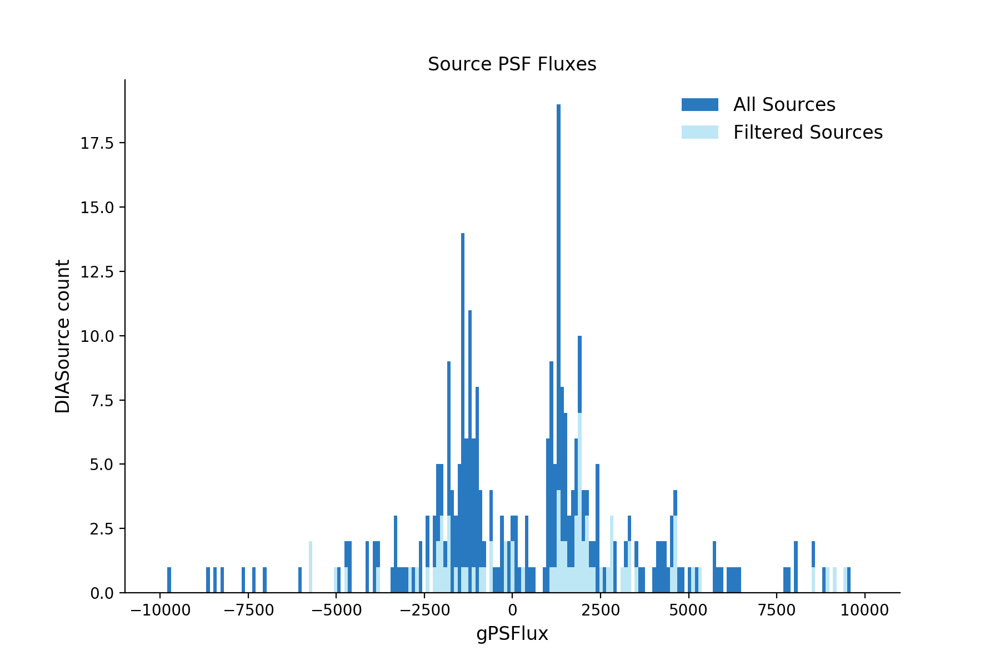

In [434]:
plotFluxHistSrc(srcTableMini, srcTable2=goodSrcMini, label1='All Sources', label2='Filtered Sources', title='Source PSF Fluxes')

<IPython.core.display.Javascript object>


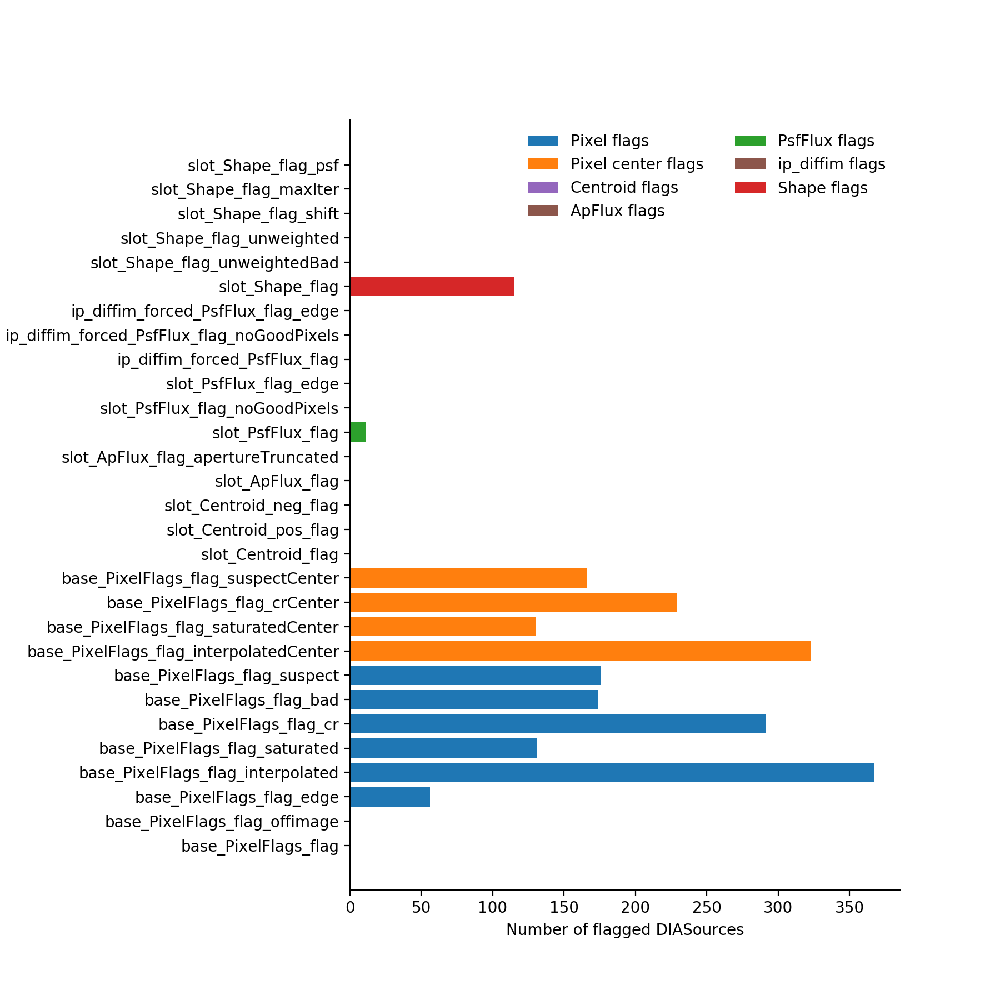

In [423]:
plot_flag_hist([count for count in flagTableMini.sum().values], list(flagValuesMini.dtype.names))

In [424]:
def makeFlagGridPlotMini(flagList, srcTableFlags, title=None):
    fig = plt.figure(figsize=(10,10))
    if title:
        fig.suptitle(title)
    for idx, flagName in enumerate(flagListNonzero):
        plotFlagged = True
        plotUnFlagged = True
        ax = fig.add_subplot(4, 4, idx+1)
        flagFilter = (srcTableFlags[flagName])
        labelTrue = flagName
        labelFalse = 'No ' + flagName
        flagFilterInverse = ~flagFilter
        if plotFlagged:
            scatterFlagged = ax.scatter(srcTableFlags.loc[flagFilter, 'ra'], 
                                        srcTableFlags.loc[flagFilter, 'decl'], 
                                        color='C3', s=1, alpha=0.2, label=labelTrue)
        if plotUnFlagged:
            scatterUnflagged = ax.scatter(srcTableFlags.loc[flagFilterInverse, 'ra'], 
                                          srcTableFlags.loc[flagFilterInverse, 'decl'], 
                                          color='C0', s=1, alpha=0.2, label=labelFalse)
        #ax.set_xlabel('RA (deg)')
        #ax.set_ylabel('Dec (deg)')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        ax.invert_xaxis()
        plt.subplots_adjust(wspace=0.15, hspace=0.15)
        title = plt.title(flagName, size=7)

<IPython.core.display.Javascript object>


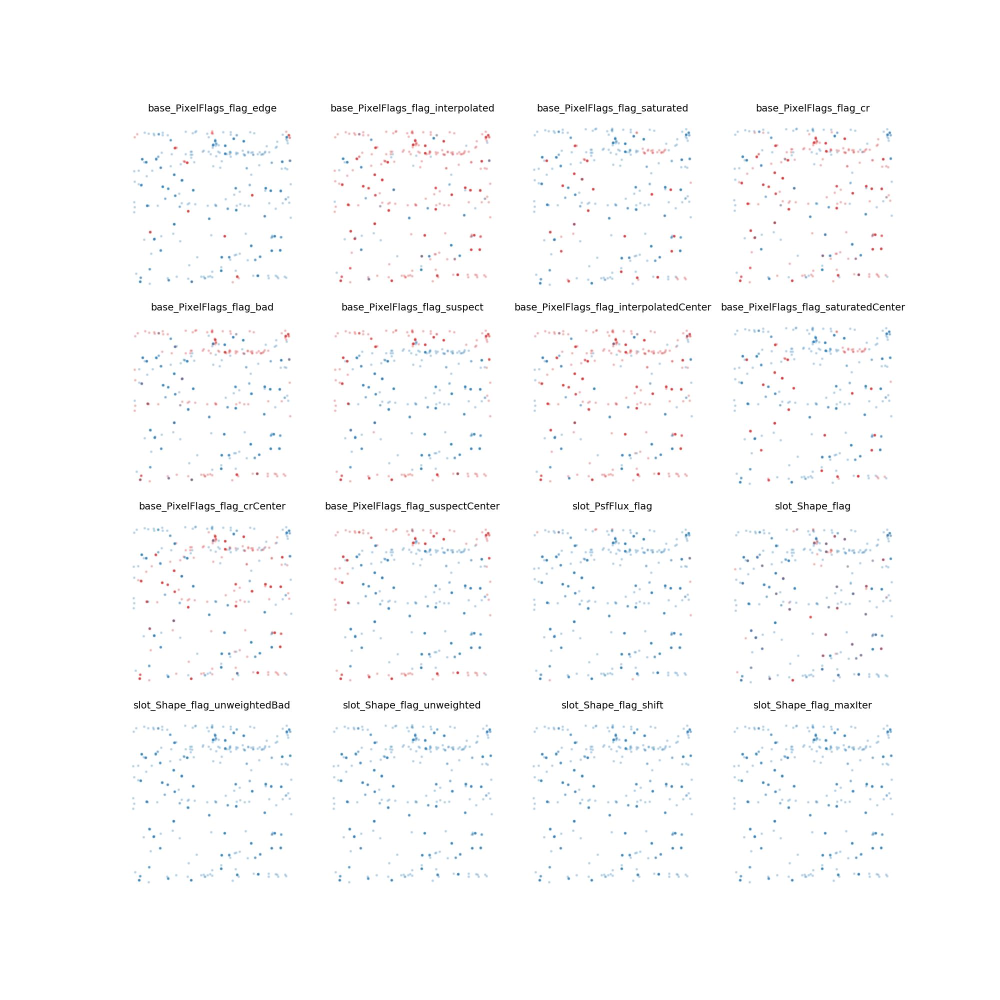

In [426]:
makeFlagGridPlotMini(flagListNonzero, srcTableFlagsMini)